<h1 style="background-color:#EB4C60; color:white;">Práctica 2: Clustering y perfilamiento de datos </h1>

**Alumna:** Erika Margarita Villaobos Martínez

**Fecha de entrega:** 13 de febrero 2026

___

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 1: Librerias y lectura de archivos </h2> 

Se importan librerias a usar para todos los ejercicios

In [100]:
## Generales
import pandas as pd
import numpy as np
import ast
import json
from bs4 import BeautifulSoup
import unicodedata
import re
from tqdm import tqdm

#Analisis de texto
import spacy
from collections import Counter

#Nube de palabras
from wordcloud import WordCloud, STOPWORDS

## Gráficos
import matplotlib.pyplot as plt
import plotly.graph_objects as go
from plotly.subplots import make_subplots
from pandas.plotting import andrews_curves
import seaborn as sns
import plotly.express as px
from mpl_toolkits.mplot3d import Axes3D

## Valores atípicos
from pyod.models.mcd import MCD

## Escaladores
from sklearn.preprocessing import RobustScaler

## Valores ausentes
from sklearn.impute import KNNImputer

## Exploración de datos
from skimpy import skim

## Codificadores
from sklearn.preprocessing import LabelEncoder
from sklearn.preprocessing import MultiLabelBinarizer

## TF-IDF
from sklearn.feature_extraction.text import TfidfVectorizer

## Reducción de dimensiones
import umap
from sklearn.metrics import silhouette_score

# Clusters
from sklearn.cluster import KMeans, DBSCAN
from sklearn.mixture import GaussianMixture
from sklearn.metrics import silhouette_score, davies_bouldin_score, calinski_harabasz_score
from yellowbrick.cluster import KElbowVisualizer
from yellowbrick.cluster import SilhouetteVisualizer

Lecuta de archivos en dataframe

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Calendar </h2>

In [58]:
df_c=pd.read_csv("../data/calendar.csv")

In [59]:
df_c.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2595,2021-12-05,f,$150.00,$150.00,30.0,1125.0
1,65615,2021-12-05,f,$85.00,$85.00,10.0,1125.0
2,65615,2021-12-06,f,$85.00,$85.00,10.0,1125.0
3,65615,2021-12-07,f,$85.00,$85.00,10.0,1125.0
4,65615,2021-12-08,f,$85.00,$85.00,10.0,1125.0


<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Listing </h2>

In [27]:
df_l=pd.read_csv("../data/listings.csv")

C:\Users\erika\AppData\Local\Temp\ipykernel_24360\2367365222.py:1: DtypeWarning: Columns (67) have mixed types. Specify dtype option on import or set low_memory=False.
  df_l=pd.read_csv("../data/listings.csv")


In [28]:
df_l.head()

,id,listing_url,scrape_id,last_scraped,name,description,neighborhood_overview,picture_url,host_id,host_url,...,review_scores_communication,review_scores_location,review_scores_value,license,instant_bookable,calculated_host_listings_count,calculated_host_listings_count_entire_homes,calculated_host_listings_count_private_rooms,calculated_host_listings_count_shared_rooms,reviews_per_month
0,2595,https://www.airbnb.com/rooms/2595,20211204143024,2021-12-05,Skylit Midtown Castle,"Beautiful, spacious skylit studio in the heart...",Centrally located in the heart of Manhattan ju...,https://a0.muscache.com/pictures/f0813a11-40b2...,2845,https://www.airbnb.com/users/show/2845,...,4.79,4.86,4.41,NaN,f,3,3,0,0,0.33
1,3831,https://www.airbnb.com/rooms/3831,20211204143024,2021-12-05,"Whole flr w/private bdrm, bath & kitchen(pls r...","Enjoy 500 s.f. top floor in 1899 brownstone, w...",Just the right mix of urban center and local n...,https://a0.muscache.com/pictures/e49999c2-9fd5...,4869,https://www.airbnb.com/users/show/4869,...,4.80,4.71,4.64,NaN,f,1,1,0,0,4.86
2,5121,https://www.airbnb.com/rooms/5121,20211204143024,2021-12-05,BlissArtsSpace!,<b>The space</b><br />HELLO EVERYONE AND THANK...,NaN,https://a0.muscache.com/pictures/2090980c-b68e...,7356,https://www.airbnb.com/users/show/7356,...,4.91,4.47,4.52,NaN,f,2,0,2,0,0.52
3,5136,https://www.airbnb.com/rooms/5136,20211204143024,2021-12-05,"Spacious Brooklyn Duplex, Patio + Garden",We welcome you to stay in our lovely 2 br dupl...,NaN,https://a0.muscache.com/pictures/miso/Hosting-...,7378,https://www.airbnb.com/users/show/7378,...,5.00,4.50,5.00,NaN,f,1,1,0,0,0.02
4,5178,https://www.airbnb.com/rooms/5178,20211204143024,2021-12-05,Large Furnished Room Near B'way,Please don’t expect the luxury here just a bas...,"Theater district, many restaurants around here.",https://a0.muscache.com/pictures/12065/f070997...,8967,https://www.airbnb.com/users/show/8967,...,4.42,4.87,4.36,NaN,f,1,0,1,0,3.68


<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Reviews </h2>

In [2]:
df_r=pd.read_csv("../data/reviews.csv")

In [3]:
df_r.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2595,17857,2009-11-21,50679,Jean,Notre séjour de trois nuits.\r<br/>Nous avons ...
1,2595,19176,2009-12-05,53267,Cate,Great experience.
2,2595,19760,2009-12-10,38960,Anita,I've stayed with my friend at the Midtown Cast...
3,2595,34320,2010-04-09,71130,Kai-Uwe,"We've been staying here for about 9 nights, en..."
4,2595,46312,2010-05-25,117113,Alicia,We had a wonderful stay at Jennifer's charming...


<h2 style="background-color:#F2A4B2; color:#595959;">Paso 2: Calidad de datos </h2>

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Calendar </h2>

In [8]:
%% time
skim(df_c)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│           Data Summary                 Data Types                                                               │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                        │
│ ┃ Dataframe         ┃ Values   ┃ ┃ Column Type ┃ Count ┃                                                        │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                        │
│ │ Number of rows    │ 13964535 │ │ string      │ 4     │                                                        │
│ │ Number of columns │ 7        │ │ float64     │ 2     │                                                        │
│ └───────────────────┴──────────┘ │ int64       │ 1     │                                                        │
│                                  └─────────────┴───────┘                                                        │
│                                                     number                                                      │
│ ┏━━━━━━━━━━┳━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column   ┃ NA ┃ NA %     ┃ mean     ┃ sd       ┃ p0   ┃ p25      ┃ p50      ┃ p75      ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━╇━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ listing_ │  0 │        0 │ 29610000 │ 17420000 │ 2595 │ 13400000 │ 30800000 │ 46430000 │ 53670000 │ ▅▃▃▃▅▇ │  │
│ │ id       │    │          │          │          │      │          │          │          │          │        │  │
│ │ minimum_ │  2 │ 1.432199 │     27.2 │    68.87 │    1 │        3 │       30 │       30 │     1250 │   ▇    │  │
│ │ nights   │    │ 49679670 │          │          │      │          │          │          │          │        │  │
│ │          │    │   68e-05 │          │          │      │          │          │          │          │        │  │
│ │ maximum_ │  2 │ 1.432199 │  2240000 │ 69290000 │    1 │      365 │     1125 │     1125 │ 21470000 │   ▇    │  │
│ │ nights   │    │ 49679670 │          │          │      │          │          │          │       00 │        │  │
│ │          │    │   68e-05 │          │          │      │          │          │          │          │        │  │
│ └──────────┴────┴──────────┴──────────┴──────────┴──────┴──────────┴──────────┴──────────┴──────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━┳━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┓  │
│ ┃          ┃     ┃          ┃           ┃          ┃           ┃          ┃ chars per ┃ words    ┃ total     ┃  │
│ ┃ column   ┃ NA  ┃ NA %     ┃ shortest  ┃ longest  ┃ min       ┃ max      ┃ row       ┃ per row  ┃ words     ┃  │
│ ┡━━━━━━━━━━╇━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━┩  │
│ │ date     │   0 │        0 │ 2021-12-0 │ 2021-12- │ 2021-12-0 │ 2022-12- │        10 │        1 │  13964535 │  │
│ │          │     │          │ 5         │ 05       │ 4         │ 04       │           │          │           │  │
│ │ availabl │   0 │        0 │ f         │ f        │ f         │ t        │         1 │        1 │  13964535 │  │
│ │ e        │     │          │           │          │           │          │           │          │           │  │
│ │ price    │ 171 │ 0.001224 │ $9.00     │ $10,000. │ $0.00     │ $999.00  │       6.6 │        1 │  13964364 │  │
│ │          │     │ 53056976 │           │ 00       │           │          │           │          │           │  │
│ │          │     │    11843 │           │          │           │          │           │          │           │  │
│ │ adjusted │ 171 │ 0.001224 │ $9.00     │ $10,000. │ $

<p style="font-size: 1.2em; font-weight: bold;"> Precisión </p>
<p> No hay duplicidad en los ids para una misma fecha </p>

In [60]:
# Marca True si el ID aparece más de una vez en la misma fecha
df_c['duplicado'] = df_c.groupby('date')['listing_id'].transform(lambda x: x.duplicated())

# Filtra solo los duplicados
duplicados = df_c[df_c['duplicado']]
print(duplicados)

Empty DataFrame
Columns: [listing_id, date, available, price, adjusted_price, minimum_nights, maximum_nights, duplicado]
Index: []


In [61]:
df_c = df_c.drop('duplicado', axis=1)

<p style="font-size: 1.2em; font-weight: bold;"> Completitud </p>
<p> Nos podemos dar cuenta que si tenemos nulos en nuestra tabla, pero representan un porcentaje muy bajo, por lo que se decidirá eliminarlos </p>

<p style="font-size: 1.2em; font-weight: bold;"> Orden </p>
Podemos visualizar con SKIM que los tipos de datos se mantienen consistentes, solamente habría que convertir las siguientes variables a tipo flotante:
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> price </li>
    <li style="color:#EB4C60; font-size: 1em;"> adjusted_price </li>
</ul>

In [62]:
df_c['price'] = pd.to_numeric(df_c['price'].str.replace(r'[$,]', '', regex=True))
df_c['adjusted_price']  = pd.to_numeric(df_c['adjusted_price'].str.replace(r'[$,]', '', regex=True))

<p style="font-size: 1.2em; font-weight: bold;"> Duplicados </p>

<p> Vimos que listing_id no tiene duplicados con respecto a una misma fecha </p>

<p style="font-size: 1.2em; font-weight: bold;"> Consistencia </p>

<p> Skim nos permite visualizar que hay consistencia a partir de los percentiles y typado de datos </p>

In [13]:
%%time
skim(df_c)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│           Data Summary                 Data Types                                                               │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓                                                        │
│ ┃ Dataframe         ┃ Values   ┃ ┃ Column Type ┃ Count ┃                                                        │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩                                                        │
│ │ Number of rows    │ 13964535 │ │ float64     │ 4     │                                                        │
│ │ Number of columns │ 7        │ │ string      │ 2     │                                                        │
│ └───────────────────┴──────────┘ │ int64       │ 1     │                                                        │
│                                  └─────────────┴───────┘                                                        │
│                                                     number                                                      │
│ ┏━━━━━━━━━━┳━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column   ┃ NA  ┃ NA %     ┃ mean     ┃ sd       ┃ p0   ┃ p25      ┃ p50      ┃ p75      ┃ p100    ┃ hist   ┃  │
│ ┡━━━━━━━━━━╇━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━┩  │
│ │ listing_ │   0 │        0 │ 29610000 │ 17420000 │ 2595 │ 13400000 │ 30800000 │ 46430000 │ 5367000 │ ▅▃▃▃▅▇ │  │
│ │ id       │     │          │          │          │      │          │          │          │       0 │        │  │
│ │ price    │ 171 │ 0.001224 │      172 │    318.5 │    0 │       70 │      115 │      189 │   14030 │   ▇    │  │
│ │          │     │ 53056976 │          │          │      │          │          │          │         │        │  │
│ │          │     │    11843 │          │          │      │          │          │          │         │        │  │
│ │ adjusted │ 171 │ 0.001224 │    171.7 │    317.5 │    0 │       70 │      115 │      189 │   14030 │   ▇    │  │
│ │ _price   │     │ 53056976 │          │          │      │          │          │          │         │        │  │
│ │          │     │    11843 │          │          │      │          │          │          │         │        │  │
│ │ minimum_ │   2 │ 1.432199 │     27.2 │    68.87 │    1 │        3 │       30 │       30 │    1250 │   ▇    │  │
│ │ nights   │     │ 49679670 │          │          │      │          │          │          │         │        │  │
│ │          │     │   68e-05 │          │          │      │          │          │          │         │        │  │
│ │ maximum_ │   2 │ 1.432199 │  2240000 │ 69290000 │    1 │      365 │     1125 │     1125 │ 2147000 │   ▇    │  │
│ │ nights   │     │ 49679670 │          │          │      │          │          │          │     000 │        │  │
│ │          │     │   68e-05 │          │          │      │          │          │          │         │        │  │
│ └──────────┴─────┴──────────┴──────────┴──────────┴──────┴──────────┴──────────┴──────────┴─────────┴────────┘  │
│                                                     string                                                      │
│ ┏━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━━━┳━━━━━━━━━━━┓  │
│ ┃           ┃    ┃      ┃           ┃           ┃           ┃           ┃ chars per ┃ words per  ┃ total     ┃  │
│ ┃ column    ┃ NA ┃ NA % ┃ shortest  ┃ longest   ┃ min       ┃ max       ┃ row       ┃ row        ┃ words     ┃  │
│ ┡━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━━━╇━━━━━━━━━━━┩  │
│ │ date      │  0 │    0 │ 2021-12-0 │ 2021-12-0 │ 2021-12-0 │ 2022-12-0 │        10 │          1 │  13964535 │  │
│ │           │    │      │ 5         │ 5         │ 4   

CPU times: total: 1min 57s
Wall time: 2min 1s


Se exporta a csv conforme se va realizando la limpieza para no tener que ejeuctar nuevamente los pasos previos.

In [63]:
df_c.to_csv('../data/calendar_clean.csv', index=False)

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Listing </h2>

In [29]:
var_num = ["id", "scrape_id", "host_id", "host_listings_count", "host_total_listings_count", "latitude", "longitude", "accommodates", "bedrooms", "beds", 
          "minimum_nights",	"maximum_nights", "minimum_minimum_nights",	"maximum_minimum_nights", "minimum_maximum_nights", "maximum_maximum_nights",
           "minimum_nights_avg_ntm", "maximum_nights_avg_ntm", "availability_30", "availability_60", "availability_90",	"availability_365",
           "number_of_reviews",	"number_of_reviews_ltm", "number_of_reviews_l30d", "review_scores_rating", "review_scores_accuracy",
           "review_scores_cleanliness",	"review_scores_checkin", "review_scores_communication",	"review_scores_location", "review_scores_value",
           "calculated_host_listings_count", "calculated_host_listings_count_entire_homes",	"calculated_host_listings_count_private_rooms",
           "calculated_host_listings_count_shared_rooms", "reviews_per_month"]

In [30]:
df_l["host_url"] = df_l["host_url"].astype("category")
df_l["host_since"] = df_l["host_since"].astype("category")
df_l["bathrooms_text"] = df_l["bathrooms_text"].astype("category")
df_l["neighbourhood_cleansed"] = df_l["neighbourhood_cleansed"].astype("category")
df_l["host_is_superhost"] = df_l["host_is_superhost"].astype("category")
df_l["license"] = df_l["license"].astype("category")
df_l["calendar_updated"] = df_l["calendar_updated"].astype("category")
df_l["host_acceptance_rate"] = df_l["host_acceptance_rate"].astype("category")
df_l["last_scraped"] = df_l["last_scraped"].astype("category")
df_l["host_about"] = df_l["host_about"].astype("category")
df_l["amenities"] = df_l["amenities"].astype("category")
df_l["host_identity_verified"] = df_l["host_identity_verified"].astype("category")
df_l["bathrooms"] = df_l["bathrooms"].astype("category")
df_l["host_neighbourhood"] = df_l["host_neighbourhood"].astype("category")
df_l["price"] = df_l["price"].astype("category")
df_l["host_response_time"] = df_l["host_response_time"].astype("category")
df_l["host_response_rate"] = df_l["host_response_rate"].astype("category")
df_l["property_type"] = df_l["property_type"].astype("category")
df_l["instant_bookable"] = df_l["instant_bookable"].astype("category")
df_l["name"] = df_l["name"].astype("category")
df_l["calendar_last_scraped"] = df_l["calendar_last_scraped"].astype("category")
df_l["host_thumbnail_url"] = df_l["host_thumbnail_url"].astype("category")
df_l["last_review"] = df_l["last_review"].astype("category")
df_l["neighbourhood"] = df_l["neighbourhood"].astype("category")
df_l["first_review"] = df_l["first_review"].astype("category")
df_l["room_type"] = df_l["room_type"].astype("category")
df_l["description"] = df_l["description"].astype("category")
df_l["picture_url"] = df_l["picture_url"].astype("category")
df_l["has_availability"] = df_l["has_availability"].astype("category")
df_l["host_name"] = df_l["host_name"].astype("category")
df_l["host_verifications"] = df_l["host_verifications"].astype("category")
df_l["host_has_profile_pic"] = df_l["host_has_profile_pic"].astype("category")
df_l["host_picture_url"] = df_l["host_picture_url"].astype("category")
df_l["listing_url"] = df_l["listing_url"].astype("category")
df_l["host_location"] = df_l["host_location"].astype("category")
df_l["neighborhood_overview"] = df_l["neighborhood_overview"].astype("category")
df_l["neighbourhood_group_cleansed"] = df_l["neighbourhood_group_cleansed"].astype("category")

In [31]:
var_cat = list(set(df_l.columns) - set(var_num))

In [32]:
%%time
skim(df_l)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types                   Categories                                    │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┓                         │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃ ┃ Categorical Variables        ┃                         │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┩                         │
│ │ Number of rows    │ 38277  │ │ category    │ 37    │ │ listing_url                  │                         │
│ │ Number of columns │ 74     │ │ float64     │ 20    │ │ last_scraped                 │                         │
│ └───────────────────┴────────┘ │ int64       │ 17    │ │ name                         │                         │
│                                └─────────────┴───────┘ │ description                  │                         │
│                                                        │ neighborhood_overview        │                         │
│                                                        │ picture_url                  │                         │
│                                                        │ host_url                     │                         │
│                                                        │ host_name                    │                         │
│                                                        │ host_since                   │                         │
│                                                        │ host_location                │                         │
│                                                        │ host_about                   │                         │
│                                                        │ host_response_time           │                         │
│                                                        │ host_response_rate           │                         │
│                                                        │ host_acceptance_rate         │                         │
│                                                        │ host_is_superhost            │                         │
│                                                        │ host_thumbnail_url           │                         │
│                                                        │ host_picture_url             │                         │
│                                                        │ host_neighbourhood           │                         │
│                                                        │ host_verifications           │                         │
│                                                        │ host_has_profile_pic         │                         │
│                                                        │ host_identity_verified       │                         │
│                                                        │ neighbourhood                │                         │
│                                                        │ neighbourhood_cleansed       │                         │
│                                                        │ neighbourhood_group_cleansed │                         │
│                                                        │ property_type                │                         │
│                                                        │ room_type                    │                         │
│                                                        │ bathrooms                    │                         │
│                                                        │ bathrooms_text               │                         │
│                                                        │ amenities                    │                         │
│                                                       

CPU times: total: 656 ms
Wall time: 643 ms


<p style="font-size: 1.2em; font-weight: bold;"> Precisión </p>
<p> No hay duplicidad en los ids para una misma fecha </p>

In [33]:
# Marca True si el ID aparece más de una vez en la misma fecha
df_l['duplicado'] = df_l.groupby('calendar_last_scraped')['id'].transform(lambda x: x.duplicated())

# Filtra solo los duplicados
duplicados = df_l[df_l['duplicado']]
print(duplicados)

Empty DataFrame
Columns: [id, listing_url, scrape_id, last_scraped, name, description, neighborhood_overview, picture_url, host_id, host_url, host_name, host_since, host_location, host_about, host_response_time, host_response_rate, host_acceptance_rate, host_is_superhost, host_thumbnail_url, host_picture_url, host_neighbourhood, host_listings_count, host_total_listings_count, host_verifications, host_has_profile_pic, host_identity_verified, neighbourhood, neighbourhood_cleansed, neighbourhood_group_cleansed, latitude, longitude, property_type, room_type, accommodates, bathrooms, bathrooms_text, bedrooms, beds, amenities, price, minimum_nights, maximum_nights, minimum_minimum_nights, maximum_minimum_nights, minimum_maximum_nights, maximum_maximum_nights, minimum_nights_avg_ntm, maximum_nights_avg_ntm, calendar_updated, has_availability, availability_30, availability_60, availability_90, availability_365, calendar_last_scraped, number_of_reviews, number_of_reviews_ltm, number_of_reviews_

C:\Users\erika\AppData\Local\Temp\ipykernel_24360\2329980897.py:2: FutureWarning: The default of observed=False is deprecated and will be changed to True in a future version of pandas. Pass observed=False to retain current behavior or observed=True to adopt the future default and silence this warning.
  df_l['duplicado'] = df_l.groupby('calendar_last_scraped')['id'].transform(lambda x: x.duplicated())


In [34]:
df_l = df_l.drop('duplicado', axis=1)

<p style="font-size: 1.2em; font-weight: bold;"> Completitud </p>
Nos podemos dar cuenta que si tenemos nulos en nuestra tabla
Se eliminan las siguientes columnas debido a que se encuentran completamente nulas:
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> bathrooms - 100% nulas </li>
    <li style="color:#EB4C60; font-size: 1em;"> calendar_updated - 100% nulas </li>
    <li style="color:#EB4C60; font-size: 1em;"> license - 99% nulas </li>
</ul>

In [35]:
df_l = df_l.drop(['bathrooms', 'calendar_updated', 'license'], axis=1)

Se identifica que las siguientes columnas están llenas con N/A, el cuál debería ser un valor nulo, se convierten los valores a nulos.
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> host_response_time </li>
    <li style="color:#EB4C60; font-size: 1em;"> host_response_rate </li>
    <li style="color:#EB4C60; font-size: 1em;"> host_acceptance_rate </li>
</ul>

In [36]:
df_l[['host_response_time', 'host_response_rate', 'host_acceptance_rate']] = df_l[['host_response_time', 'host_response_rate', 'host_acceptance_rate']].replace("N/A", pd.NA)

Se identifica que las siguientes columnas tienen entre un 40% a 50% de valores nulos, son variables de texto y se detecta que no tienen relevancia para el objetivo de encontrar similitudes en lo que ofrecen los distintos airbnb, por lo que se decide que sean eliminadas.
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> neighborhood_overview: </strong> No incluye alguna característica sobre lo que ofrece el airbnb de forma interna </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> host_about: </strong> Información acerca del host, la cuál no nos dice nada sobre las características del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> host_response_time: </strong> Tiempo de respuesta del host, no es relevante </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> neighbourhood: </strong> Tenemos las columnas neighbourhood_cleansed y neighbourhood_group_cleansed que pueden ser más detalladas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> host_neighbourhood: </strong> Tenemos las columnas neighbourhood_cleansed y neighbourhood_group_cleansed que pueden ser más detalladas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> first_review: </strong> Fecha de la primera reseña </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong> last_review: </strong> Fecha de la última reseña </li>
</ul>

In [37]:
df_l = df_l.drop(['neighborhood_overview', 'host_about', 'host_response_time', 'neighbourhood', 'host_neighbourhood', 'first_review', 'last_review'], axis=1)

<p style="font-size: 1.2em; font-weight: bold;"> Orden </p>
Podemos visualizar con SKIM que los tipos de datos se mantienen consistentes, solamente habría que convertir las siguientes variables a tipo flotante:
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> host_response_rate </li>
    <li style="color:#EB4C60; font-size: 1em;"> host_acceptance_rate </li>
    <li style="color:#EB4C60; font-size: 1em;"> price </li>
</ul>

In [38]:
df_l['host_response_rate']  = pd.to_numeric(df_l['host_response_rate'].str.replace(r'[%]', '', regex=True))
df_l['host_acceptance_rate']  = pd.to_numeric(df_l['host_acceptance_rate'].str.replace(r'[%]', '', regex=True))
df_l['price'] = pd.to_numeric(df_l['price'].str.replace(r'[$,]', '', regex=True))

<p style="font-size: 1.2em; font-weight: bold;"> Duplicados </p>

<p> Vimos que id no tiene duplicados con respecto a una misma fecha. </p>

<p style="font-size: 1.2em; font-weight: bold;"> Consistencia </p>

<p> Skim nos permite visualizar que hay consistencia a partir de los percentiles y typado de datos, pero se decide limpiar el resto de variables que no tendrán relevancia para llegar al objetivo </p>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>listing_url:</strong> Url del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>scrape_id:</strong> Identificador que no nos será de utilidad para realizar el join </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>last_scraped:</strong> Ultima fecha en la que se obtuvieron los datos, solo contiene una fecha </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>name:</strong> El nombre del airbb no nos será de ayuda en la clusterización </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>picture_url:</strong> Url de una foto del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_id:</strong> Id del host del airbnb, no nos sirve para hacer join </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_url:</strong> Url del host del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_verifications:</strong> Métodos con los que se idnetificó el host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_name:</strong> Nombre del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_since:</strong> Fecha inicio del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_location:</strong> Ubicación del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_thumbnail_url:</strong> Foto miniatura de perfil del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_picture_url:</strong> Foto de perfil del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>calendar_last_scraped:</strong> Ultima fecha en la que se obtuvieron los datos, solo contiene una fecha </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_is_superhost:</strong> Información sobre el host y no sobre lo que ofrece el airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_listings_count:</strong> Cantidad de anuncios que tiene el host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_total_listings_count:</strong> Total de anuncios que tiene el host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_has_profile_pic:</strong> Si el host tiene foto o no </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>host_identity_verified:</strong> Si el host esta verificado o no </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>latitude:</strong> Latitud del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>longitude:</strong> Longitud del airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>has_availability:</strong> Si tiene disponibilidad </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>number_of_reviews:</strong> Total de reseñas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>number_of_reviews_ltm:</strong> Total de reseñas en el año </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>number_of_reviews_l30d:</strong> Total de reseñas en los últimos 30 días </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>instant_bookable:</strong> Disponibilidad para reservar </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>calculated_host_listings_count:</strong> Total de anuncios del host </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>calculated_host_listings_count_entire_homes:</strong> Número de anuncios que tiene el host por casas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>calculated_host_listings_count_private_rooms:</strong> Número de anuncios por habitaciones privadas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>calculated_host_listings_count_shared_rooms:</strong> Número de anuncios por habitaciones compartidas </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>reviews_per_month:</strong> Reseñas por mes </li>
</ul>

In [40]:
df_l = df_l.drop(['listing_url', 'scrape_id', 'last_scraped', 'name', 'picture_url', 
                  'host_id', 'host_url', 'host_name', 'host_since', 'host_location', 
                  'host_thumbnail_url', 'host_picture_url', 'calendar_last_scraped',
                  'host_verifications', 'host_is_superhost', 'host_listings_count',
                  'host_total_listings_count', 'host_has_profile_pic', 'host_identity_verified',
                  'latitude', 'longitude', 'has_availability', 'number_of_reviews',
                  'number_of_reviews_ltm', 'number_of_reviews_l30d', 'instant_bookable',
                  'calculated_host_listings_count', 'calculated_host_listings_count_entire_homes',
                  'calculated_host_listings_count_private_rooms',
                  'calculated_host_listings_count_shared_rooms', 'reviews_per_month'], axis=1)

In [41]:
df_l.head()

,id,description,host_response_rate,host_acceptance_rate,neighbourhood_cleansed,neighbourhood_group_cleansed,property_type,room_type,accommodates,bathrooms_text,...,availability_60,availability_90,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,2595,"Beautiful, spacious skylit studio in the heart...",80.0,17.0,Midtown,Manhattan,Entire rental unit,Entire home/apt,1,1 bath,...,33,63,338,4.70,4.72,4.62,4.76,4.79,4.86,4.41
1,3831,"Enjoy 500 s.f. top floor in 1899 brownstone, w...",9.0,69.0,Bedford-Stuyvesant,Brooklyn,Entire guest suite,Entire home/apt,3,1 bath,...,6,18,194,4.45,4.58,4.49,4.78,4.80,4.71,4.64
2,5121,<b>The space</b><br />HELLO EVERYONE AND THANK...,100.0,100.0,Bedford-Stuyvesant,Brooklyn,Private room in rental unit,Private room,2,NaN,...,60,90,365,4.52,4.22,4.09,4.91,4.91,4.47,4.52
3,5136,We welcome you to stay in our lovely 2 br dupl...,100.0,25.0,Sunset Park,Brooklyn,Entire rental unit,Entire home/apt,4,1.5 baths,...,3,12,123,5.00,5.00,5.00,5.00,5.00,4.50,5.00
4,5178,Please don’t expect the luxury here just a bas...,100.0,100.0,Midtown,Manhattan,Private room in rental unit,Private room,2,1 bath,...,16,34,192,4.21,4.21,3.73,4.66,4.42,4.87,4.36


<p style="font-size: 1.2em; font-weight: bold;"> Limpieza columna amenities </p>

<p> La columna que se encuentran dentro de una lista son sacadas de la misma para poder trabajar con ella, se normaliza </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> amenities </li>
</ul>

In [42]:
# Se regresa el tipo de datos string para poder manipularlo y se lee como tipo json
df_l["amenities"] = df_l["amenities"].astype(str).apply(json.loads)

In [43]:
# Se hace tratamiento de la columna a minpusculas y se remueven posibles espacios
df_l["amenities"] = df_l["amenities"].apply(
    lambda x: [i.lower().strip() for i in x]
)

In [44]:
print(df_l["amenities"].head())
print(type(df_l["amenities"].iloc[0]))

0    [extra pillows and blankets, baking sheet, lug...
1    [extra pillows and blankets, luggage dropoff a...
2    [kitchen, long term stays allowed, wifi, heati...
3    [kitchen, bbq grill, cable tv, carbon monoxide...
4    [room-darkening shades, lock on bedroom door, ...
Name: amenities, dtype: object
<class 'list'>


<p style="font-size: 1.2em; font-weight: bold;"> Limpieza columna description </p>

<p> Se elimina formato html y se normaliza quitando acentos y llevando a minúsculas </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> description </li>
</ul>

In [49]:
def clean_description(text):
    # 1. Eliminar etiquetas HTML
    text = BeautifulSoup(text, "html.parser").get_text()
    
    # 2. Pasar a minúsculas
    text = text.lower()
    
    # 3. Normalizar acentos
    text = unicodedata.normalize("NFKD", text).encode("ascii", "ignore").decode("utf-8")
    
    # 4. Eliminar puntuación y espacios extra
    text = re.sub(r"[^\w\s]", " ", text)  # elimina signos
    text = re.sub(r"\s+", " ", text)      # espacios múltiples → uno
    return text.strip()

df_l["description_clean"] = df_l["description"].apply(clean_description)

In [54]:
df_l["description"] = df_l["description_clean"]
df_l = df_l.drop('description_clean', axis=1)

In [55]:
df_l.head()

,id,description,host_response_rate,host_acceptance_rate,neighbourhood_cleansed,neighbourhood_group_cleansed,property_type,room_type,accommodates,bathrooms_text,...,availability_60,availability_90,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,2595,beautiful spacious skylit studio in the heart ...,80.0,17.0,Midtown,Manhattan,Entire rental unit,Entire home/apt,1,1 bath,...,33,63,338,4.70,4.72,4.62,4.76,4.79,4.86,4.41
1,3831,enjoy 500 s f top floor in 1899 brownstone w w...,9.0,69.0,Bedford-Stuyvesant,Brooklyn,Entire guest suite,Entire home/apt,3,1 bath,...,6,18,194,4.45,4.58,4.49,4.78,4.80,4.71,4.64
2,5121,the spacehello everyone and thanks for visitin...,100.0,100.0,Bedford-Stuyvesant,Brooklyn,Private room in rental unit,Private room,2,NaN,...,60,90,365,4.52,4.22,4.09,4.91,4.91,4.47,4.52
3,5136,we welcome you to stay in our lovely 2 br dupl...,100.0,25.0,Sunset Park,Brooklyn,Entire rental unit,Entire home/apt,4,1.5 baths,...,3,12,123,5.00,5.00,5.00,5.00,5.00,4.50,5.00
4,5178,please dont expect the luxury here just a basi...,100.0,100.0,Midtown,Manhattan,Private room in rental unit,Private room,2,1 bath,...,16,34,192,4.21,4.21,3.73,4.66,4.42,4.87,4.36


In [56]:
df_l.to_csv('../data/listing_clean.csv', index=False)

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Reviews </h2>

In [77]:
df_r["date"] = df_r["date"].astype("category")
df_r["reviewer_name"] = df_r["reviewer_name"].astype("category")
df_r["comments"] = df_r["comments"].astype("category")

In [78]:
%%time
skim(df_r)

╭──────────────────────────────────────────────── skimpy summary ─────────────────────────────────────────────────╮
│          Data Summary                Data Types               Categories                                        │
│ ┏━━━━━━━━━━━━━━━━━━━┳━━━━━━━━┓ ┏━━━━━━━━━━━━━┳━━━━━━━┓ ┏━━━━━━━━━━━━━━━━━━━━━━━┓                                │
│ ┃ Dataframe         ┃ Values ┃ ┃ Column Type ┃ Count ┃ ┃ Categorical Variables ┃                                │
│ ┡━━━━━━━━━━━━━━━━━━━╇━━━━━━━━┩ ┡━━━━━━━━━━━━━╇━━━━━━━┩ ┡━━━━━━━━━━━━━━━━━━━━━━━┩                                │
│ │ Number of rows    │ 891964 │ │ int64       │ 3     │ │ date                  │                                │
│ │ Number of columns │ 6      │ │ category    │ 3     │ │ reviewer_name         │                                │
│ └───────────────────┴────────┘ └─────────────┴───────┘ │ comments              │                                │
│                                                        └───────────────────────┘                                │
│                                                     number                                                      │
│ ┏━━━━━━━━━━━┳━━━━┳━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━━━━┳━━━━━━━━━━┳━━━━━━━━┓  │
│ ┃ column    ┃ NA ┃ NA % ┃ mean      ┃ sd       ┃ p0   ┃ p25       ┃ p50      ┃ p75       ┃ p100     ┃ hist   ┃  │
│ ┡━━━━━━━━━━━╇━━━━╇━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━━━━╇━━━━━━━━━━╇━━━━━━━━┩  │
│ │ listing_i │  0 │    0 │  18630000 │ 14860000 │ 2595 │   5320000 │ 16230000 │  29340000 │ 53650000 │ ▇▅▅▃▂▂ │  │
│ │ d         │    │      │           │          │      │           │          │           │          │        │  │
│ │ id        │  0 │    0 │ 6.281e+16 │ 1.564e+1 │ 1743 │ 195500000 │ 43620000 │ 649500000 │ 5.108e+1 │ ▇    ▁ │  │
│ │           │    │      │           │        7 │      │           │        0 │           │        7 │        │  │
│ │ reviewer_ │  0 │    0 │ 112000000 │ 10950000 │    1 │  23030000 │ 72700000 │ 174500000 │ 43460000 │ ▇▃▂▁▁▁ │  │
│ │ id        │    │      │           │        0 │      │           │          │           │        0 │        │  │
│ └───────────┴────┴──────┴───────────┴──────────┴──────┴───────────┴──────────┴───────────┴──────────┴────────┘  │
│                                                    category                                                     │
│ ┏━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━┳━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━━━━┳━━━━━━━━━━━━━┓  │
│ ┃ column                    ┃ NA      ┃ NA %                                  ┃ ordered        ┃ unique      ┃  │
│ ┡━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━╇━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━━━━╇━━━━━━━━━━━━━┩  │
│ │ date                      │       0 │                                     0 │ False          │        4281 │  │
│ │ reviewer_name             │       7 │                  0.000784785036167379 │ False          │      107558 │  │
│ │ comments                  │     910 │                   0.10202205470175926 │ False          │      851607 │  │
│ └───────────────────────────┴─────────┴───────────────────────────────────────┴────────────────┴─────────────┘  │
╰────────────────────────────────────────────────────── End ──────────────────────────────────────────────────────╯

CPU times: total: 547 ms
Wall time: 561 ms


<p style="font-size: 1.2em; font-weight: bold;"> Precisión </p>
<p> Se evalua si hay duplicidad al agrupar la fecha, el id de quién escribe la reseña y el id del airbnb.
Se observa que hay un total de 102 filas duplicadas, lo que corresponde a un 0.01%, por lo que no presenta un impacto significante. </p>

In [82]:
# Detecta duplicados considerando date + reviewer_id + listing_id
df_r['duplicado'] = df_r.duplicated(subset=['date', 'reviewer_id', 'listing_id'], keep=False)

# Filtra solo los duplicados
duplicados = df_r[df_r['duplicado']]
print(duplicados)

        listing_id                  id        date  reviewer_id reviewer_name  \
28025       151199           105170120  2016-09-30         1698           Luc   
28026       151199           105170123  2016-09-30         1698           Luc   
30008       169306              697211  2011-11-07      1112657        Sandra   
30009       169306              697212  2011-11-07      1112657        Sandra   
38066       239733            13498051  2014-05-28     11712266         Cielo   
...            ...                 ...         ...          ...           ...   
884095    51732203  443432140773964665  2021-09-03     18696106         David   
888038    52277683  475999838686318049  2021-10-18     40318243        Andrew   
888039    52277683  475999839614227671  2021-10-18     40318243        Andrew   
888244    52348946  458648930070024161  2021-09-24    378205146  Tim And Mila   
888245    52348946  458743651529824038  2021-09-24    378205146  Tim And Mila   

                           

In [83]:
# Se eliminan duplicados considerando date + reviewer_id + listing_id
df_r = df_r.drop_duplicates(subset=['date', 'reviewer_id', 'listing_id'], keep='first')

In [84]:
df_r = df_r.drop('duplicado', axis=1)

<p style="font-size: 1.2em; font-weight: bold;"> Completitud </p>
<p> Nos podemos dar cuenta que si no tenemos nulos en nuestras variables numéricas, si presentamos valores nulos en las varaibles categóricas pero podemos trabajar con este porcentaje de nulos debido a que son validos </p>

<p style="font-size: 1.2em; font-weight: bold;"> Orden </p>
Podemos visualizar con SKIM que los tipos de datos se mantienen consistentes.

<p style="font-size: 1.2em; font-weight: bold;"> Duplicados </p>

<p> Se trataron en el apartado de presición </p>

<p style="font-size: 1.2em; font-weight: bold;"> Consistencia </p>
<p> Se normaliza columna comments </p>

In [7]:
%%time
def clean_comments(text):
    # Si el valor es NaN o no es string, devolver cadena vacía
    if pd.isna(text):
        return ""
    
    # 1. Eliminar etiquetas HTML
    text = BeautifulSoup(str(text), "html.parser").get_text()
    
    # 2. Pasar a minúsculas
    text = text.lower()
    
    # 3. Normalizar acentos
    text = unicodedata.normalize("NFKD", text).encode("ascii", "ignore").decode("utf-8")
    
    # 4. Eliminar puntuación y espacios extra
    text = re.sub(r"[^\w\s]", " ", text)  # elimina signos
    text = re.sub(r"\s+", " ", text)      # espacios múltiples → uno
    
    return text.strip()

# Aplicar a la columna comments
df_r["comments_clean"] = df_r["comments"].apply(clean_comments)

CPU times: total: 2min 46s
Wall time: 2min 53s


In [9]:
df_r["comments"] = df_r["comments_clean"]
df_r = df_r.drop('comments_clean', axis=1)

In [10]:
df_r.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2595,17857,2009-11-21,50679,Jean,notre sejour de trois nuits nous avons appreci...
1,2595,19176,2009-12-05,53267,Cate,great experience
2,2595,19760,2009-12-10,38960,Anita,i ve stayed with my friend at the midtown cast...
3,2595,34320,2010-04-09,71130,Kai-Uwe,we ve been staying here for about 9 nights enj...
4,2595,46312,2010-05-25,117113,Alicia,we had a wonderful stay at jennifer s charming...


Se exporta a csv conforme se va realizando la limpieza para no tener que ejeuctar nuevamente los pasos previos.

In [12]:
df_r.to_csv('../data/reviews_clean.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 3: Unión de tablas </h2> 

<p> Se vuelve a realizar lectura de archivos, ya que en la etapa pasa se guardaron para poder continuar desde este punto </p>

In [21]:
df_cc=pd.read_csv("../data/calendar_clean.csv")

In [22]:
df_lc=pd.read_csv("../data/listing_clean.csv")

In [23]:
df_rc=pd.read_csv("../data/reviews_clean.csv")

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Calendar </h2>

In [24]:
df_cc.head()

,listing_id,date,available,price,adjusted_price,minimum_nights,maximum_nights
0,2595,2021-12-05,f,150.0,150.0,30.0,1125.0
1,65615,2021-12-05,f,85.0,85.0,10.0,1125.0
2,65615,2021-12-06,f,85.0,85.0,10.0,1125.0
3,65615,2021-12-07,f,85.0,85.0,10.0,1125.0
4,65615,2021-12-08,f,85.0,85.0,10.0,1125.0


In [39]:
# Se decide tomar las variables identificador y precio para la tabla de datos
calendar_summary = df_cc.groupby("listing_id")["price"].mean().reset_index()
calendar_summary = calendar_summary.rename(columns={"price":"avg_price"})

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Listings </h2>

In [26]:
df_lc.head()

,id,description,host_response_rate,host_acceptance_rate,neighbourhood_cleansed,neighbourhood_group_cleansed,property_type,room_type,accommodates,bathrooms_text,...,availability_60,availability_90,availability_365,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value
0,2595,beautiful spacious skylit studio in the heart ...,80.0,17.0,Midtown,Manhattan,Entire rental unit,Entire home/apt,1,1 bath,...,33,63,338,4.70,4.72,4.62,4.76,4.79,4.86,4.41
1,3831,enjoy 500 s f top floor in 1899 brownstone w w...,9.0,69.0,Bedford-Stuyvesant,Brooklyn,Entire guest suite,Entire home/apt,3,1 bath,...,6,18,194,4.45,4.58,4.49,4.78,4.80,4.71,4.64
2,5121,the spacehello everyone and thanks for visitin...,100.0,100.0,Bedford-Stuyvesant,Brooklyn,Private room in rental unit,Private room,2,NaN,...,60,90,365,4.52,4.22,4.09,4.91,4.91,4.47,4.52
3,5136,we welcome you to stay in our lovely 2 br dupl...,100.0,25.0,Sunset Park,Brooklyn,Entire rental unit,Entire home/apt,4,1.5 baths,...,3,12,123,5.00,5.00,5.00,5.00,5.00,4.50,5.00
4,5178,please dont expect the luxury here just a basi...,100.0,100.0,Midtown,Manhattan,Private room in rental unit,Private room,2,1 bath,...,16,34,192,4.21,4.21,3.73,4.66,4.42,4.87,4.36


In [27]:
df_lc.columns

Index(['id', 'description', 'host_response_rate', 'host_acceptance_rate',
       'neighbourhood_cleansed', 'neighbourhood_group_cleansed',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'bedrooms', 'beds', 'amenities', 'price', 'minimum_nights',
       'maximum_nights', 'minimum_minimum_nights', 'maximum_minimum_nights',
       'minimum_maximum_nights', 'maximum_maximum_nights',
       'minimum_nights_avg_ntm', 'maximum_nights_avg_ntm', 'availability_30',
       'availability_60', 'availability_90', 'availability_365',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value'],
      dtype='object')

In [28]:
# Se decide llevar las siguientes columnas de la tabla lsitings a la tabla final
listings_summary = df_lc[[
    "id",
    "description",
    "neighbourhood_group_cleansed",
    "property_type",
    "room_type",
    "accommodates",
    "bathrooms_text",
    "bedrooms",
    "beds",
    "amenities",
    "minimum_nights",
    "maximum_nights",
    "review_scores_rating",
    "review_scores_accuracy",
    "review_scores_cleanliness",
    "review_scores_checkin",
    "review_scores_communication",
    "review_scores_location",
    "review_scores_value"
]].rename(columns={"id":"listing_id"})

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Reviews </h2>

In [29]:
df_rc.head()

,listing_id,id,date,reviewer_id,reviewer_name,comments
0,2595,17857,2009-11-21,50679,Jean,notre sejour de trois nuits nous avons appreci...
1,2595,19176,2009-12-05,53267,Cate,great experience
2,2595,19760,2009-12-10,38960,Anita,i ve stayed with my friend at the midtown cast...
3,2595,34320,2010-04-09,71130,Kai-Uwe,we ve been staying here for about 9 nights enj...
4,2595,46312,2010-05-25,117113,Alicia,we had a wonderful stay at jennifer s charming...


In [30]:
# Se decide llevar las columnas identificador y comentarios a la tabla a explorar
reviews_summary = df_rc.groupby("listing_id")["comments"].apply(list).reset_index()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Union de tablas resumen </h2>

In [32]:
#Unión de las variables a usar en la tabla a explorar
df_data = listings_summary.merge(reviews_summary, on="listing_id", how="left") \
                          .merge(calendar_summary, on="listing_id", how="left")

In [33]:
df_data.head()

,listing_id,description,neighbourhood_group_cleansed,property_type,room_type,accommodates,bathrooms_text,bedrooms,beds,amenities,...,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,comments,avg_price
0,2595,beautiful spacious skylit studio in the heart ...,Manhattan,Entire rental unit,Entire home/apt,1,1 bath,NaN,1.0,"['extra pillows and blankets', 'baking sheet',...",...,1125,4.70,4.72,4.62,4.76,4.79,4.86,4.41,[notre sejour de trois nuits nous avons apprec...,198.441096
1,3831,enjoy 500 s f top floor in 1899 brownstone w w...,Brooklyn,Entire guest suite,Entire home/apt,3,1 bath,1.0,3.0,"['extra pillows and blankets', 'luggage dropof...",...,730,4.45,4.58,4.49,4.78,4.80,4.71,4.64,[lisa is a wonderful kind and thoughtful host ...,76.136986
2,5121,the spacehello everyone and thanks for visitin...,Brooklyn,Private room in rental unit,Private room,2,NaN,1.0,1.0,"['kitchen', 'long term stays allowed', 'wifi',...",...,730,4.52,4.22,4.09,4.91,4.91,4.47,4.52,"[simple place super nice guy, great guy with a...",60.000000
3,5136,we welcome you to stay in our lovely 2 br dupl...,Brooklyn,Entire rental unit,Entire home/apt,4,1.5 baths,2.0,2.0,"['kitchen', 'bbq grill', 'cable tv', 'carbon m...",...,1125,5.00,5.00,5.00,5.00,5.00,4.50,5.00,[my family had a wonderful stay at rebecca and...,275.000000
4,5178,please dont expect the luxury here just a basi...,Manhattan,Private room in rental unit,Private room,2,1 bath,1.0,1.0,"['room-darkening shades', 'lock on bedroom doo...",...,14,4.21,4.21,3.73,4.66,4.42,4.87,4.36,[mr kasai was a grreat host very helpful and h...,68.000000


In [35]:
df_data.columns

Index(['listing_id', 'description', 'neighbourhood_group_cleansed',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'bedrooms', 'beds', 'amenities', 'minimum_nights', 'maximum_nights',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'comments', 'avg_price'],
      dtype='object')

In [38]:
df_data.to_csv('../data/data_explor.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 4: EDA </h2> 

Se lee tabla resumen de variables

In [3]:
df_data=pd.read_csv("../data/data_explor.csv")

In [4]:
var_id = ["listing_id"]

In [5]:
var_num = ["accommodates", "bedrooms", "beds", "minimum_nights", "maximum_nights", "review_scores_rating", 
           "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", 
           "review_scores_communication", "review_scores_location", "review_scores_value",
           "avg_price"]

In [6]:
var_cat = ["neighbourhood_group_cleansed", "property_type", "room_type", "bathrooms_text"]

In [7]:
var_text = ["description", "comments"]

In [8]:
var_list = ["amenities"]

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> EDA numéricas y categóricas </h2>

In [52]:
#Definimos un objeto para graficar
class analyze:
    # Inicializamos la clase
    def __init__(self, df, num_vars, cat_vars):
        self.df = df
        self.num_vars = num_vars
        self.cat_vars = cat_vars

    #Método para graficar variables numéricas
    def plot_num(self):
        for var in self.num_vars:
            fig = make_subplots(rows=1, cols=2, subplot_titles=(f"{var} - Boxplot", f"{var} - Histograma"))

            # Boxplot
            fig.add_trace(
                go.Box(y=self.df[var], name="Boxplot", marker_color="#EB4C60"),
                row=1, col=1
            )

            # Histograma
            fig.add_trace(
                go.Histogram(x=self.df[var], name="Histograma",
                             marker_color="#F2A4B2", nbinsx=50,
                             histnorm='probability density'),
                row=1, col=2
            )

            fig.update_layout(title_text=f"Variable: {var}", height=400, width=800)
            fig.show()

    #Método para graficar variables categóricas
    def plot_cat(self):
        for var in self.cat_vars:
            value_counts = self.df[var].value_counts()
            labels = value_counts.index.astype(str)
            values = value_counts.values

            fig = go.Figure(
                data=[go.Pie(labels=labels, values=values, textinfo='percent+label')]
            )

            fig.update_layout(title_text=f"Variable: {var}", height=400, width=500)
            fig.show()

    #Método para graficar la matriz de correlación de numéricas
    def corr_matrix(self):
        corr_matrix = self.df[self.num_vars].corr()

        fig = go.Figure(data=go.Heatmap(
            z=corr_matrix.values,
            x=corr_matrix.columns,
            y=corr_matrix.columns,
            colorscale='Viridis'))

        fig.update_layout(
            title='Matriz de Correlación',
            width=800,
            height=600
        )

        fig.show()

In [53]:
analisis = analyze(df_data, var_num, var_cat)

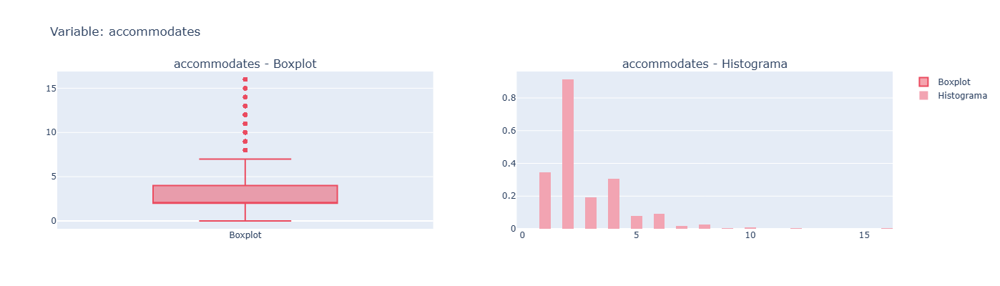

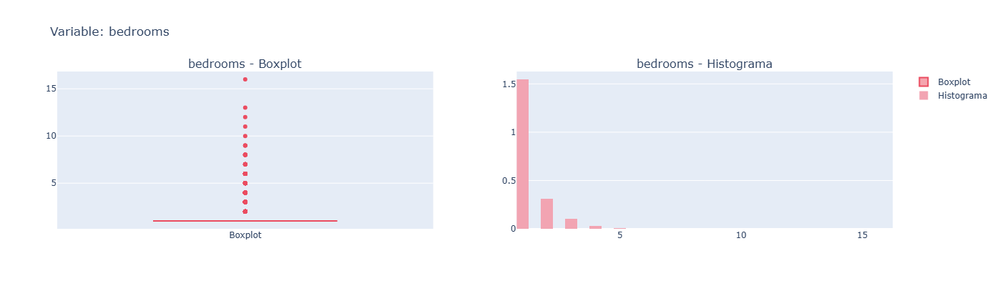

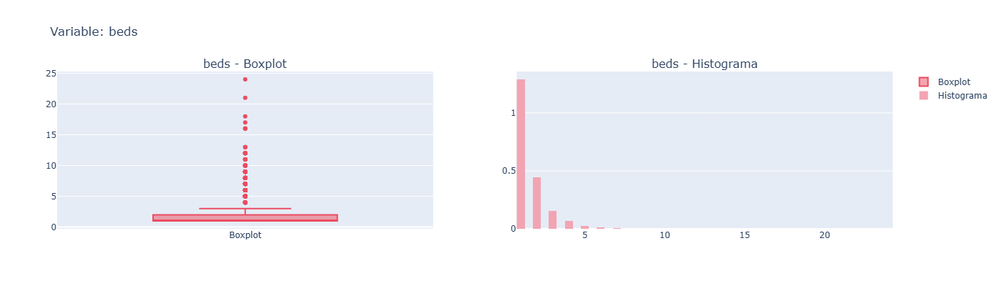

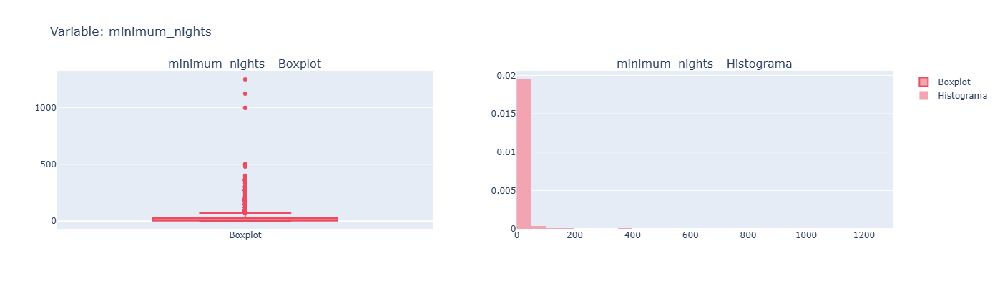

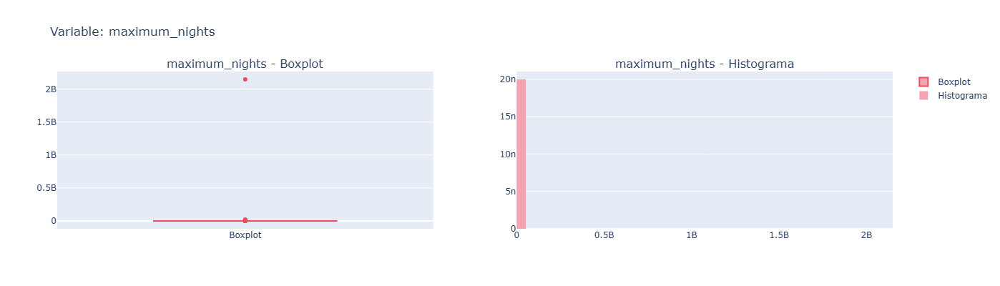

...

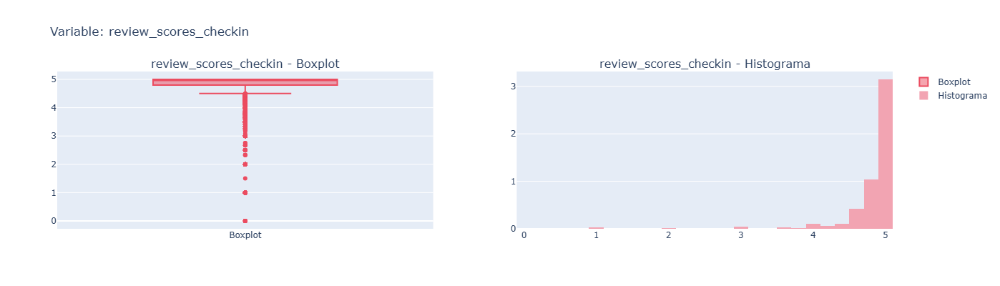

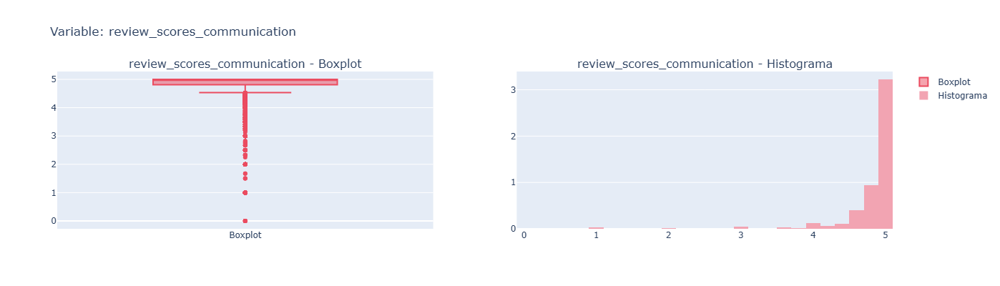

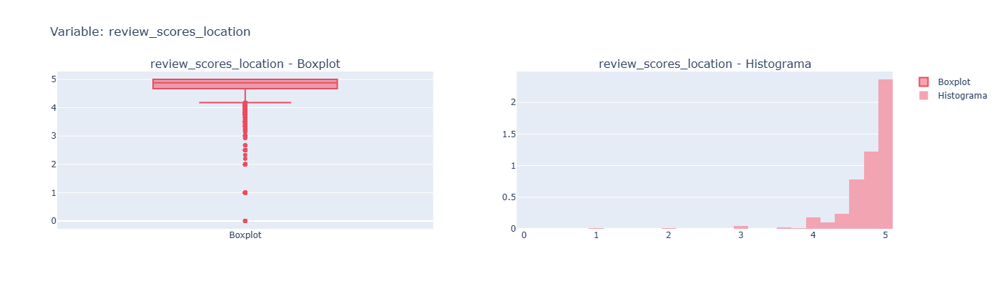

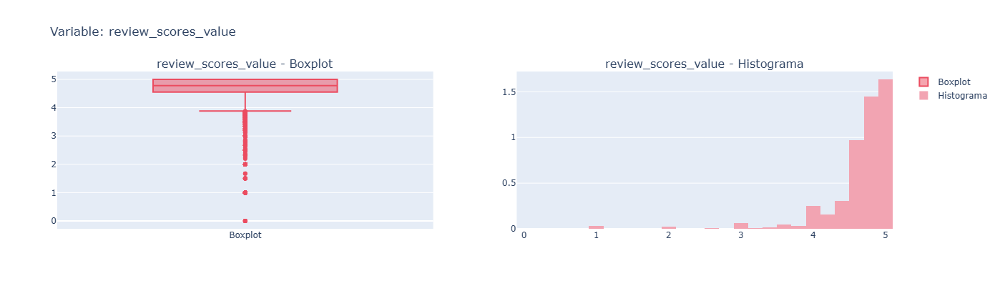

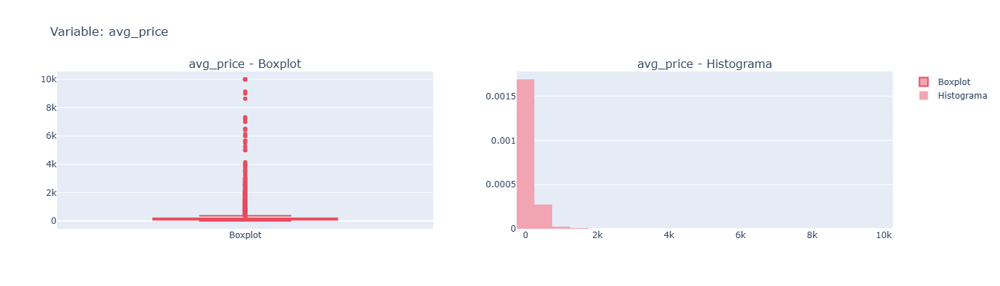

CPU times: total: 828 ms
Wall time: 819 ms


In [54]:
%%time
analisis.plot_num()

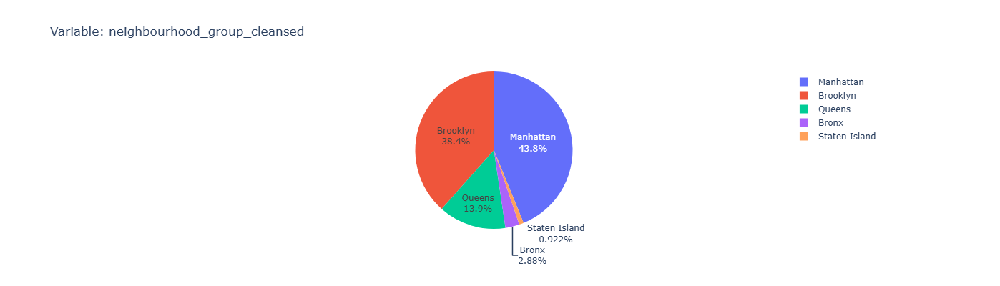

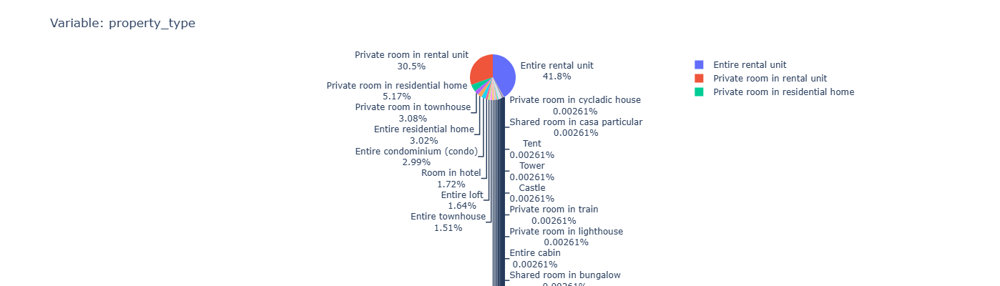

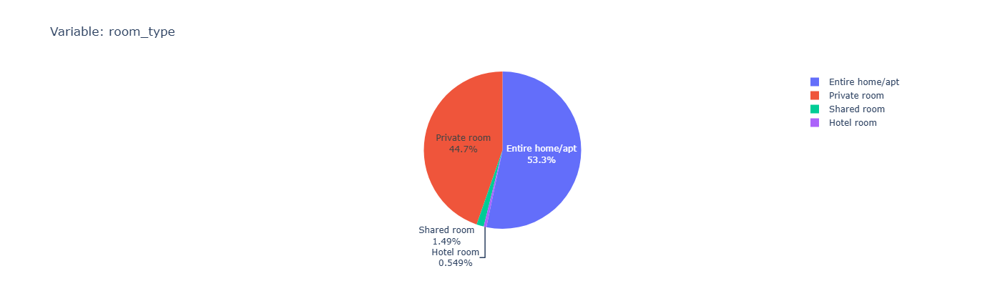

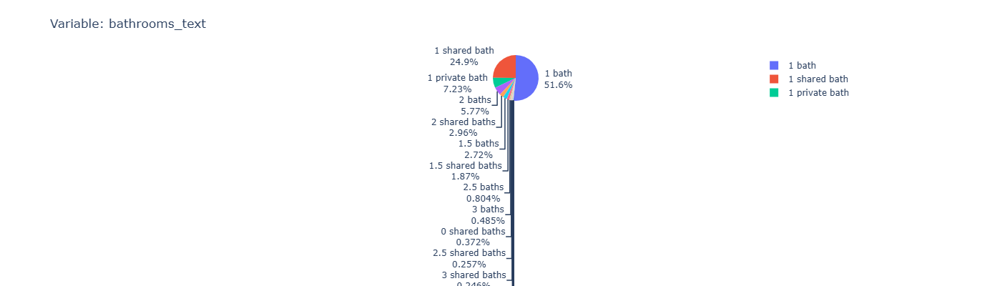

CPU times: total: 109 ms
Wall time: 108 ms


In [55]:
%%time
analisis.plot_cat()

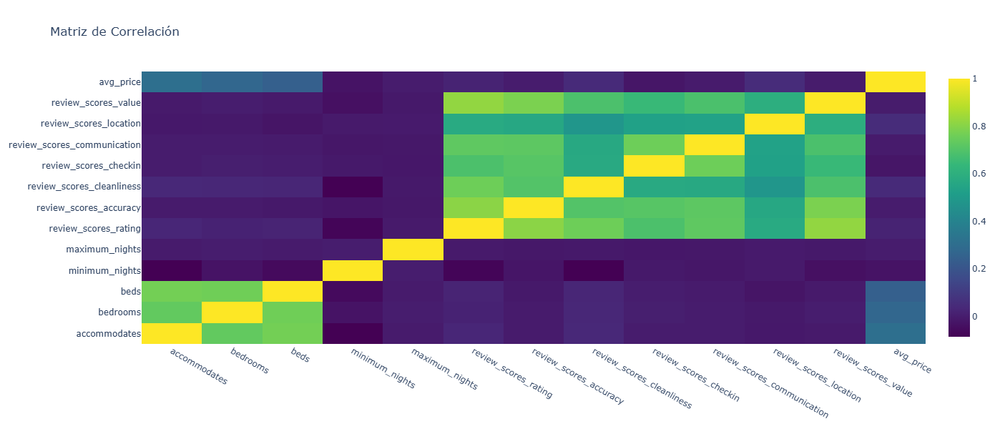

In [56]:
analisis.corr_matrix()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> EDA textos </h2>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> amenities </li>
</ul>

In [8]:
df_data["amenities"] = df_data["amenities"].apply(ast.literal_eval)

In [9]:
%%time
# Unir todas las listas en una sola
all_amenities = sum(df_data["amenities"], [])

# Contar frecuencia
freq = Counter(all_amenities)

# Top 10 amenidades más comunes
print(freq.most_common(10))

[('wifi', 37031), ('long term stays allowed', 35079), ('kitchen', 34013), ('smoke alarm', 33805), ('heating', 33110), ('essentials', 33076), ('air conditioning', 31305), ('carbon monoxide alarm', 28547), ('hangers', 28479), ('hair dryer', 24093)]
CPU times: total: 4min 58s
Wall time: 4min 58s


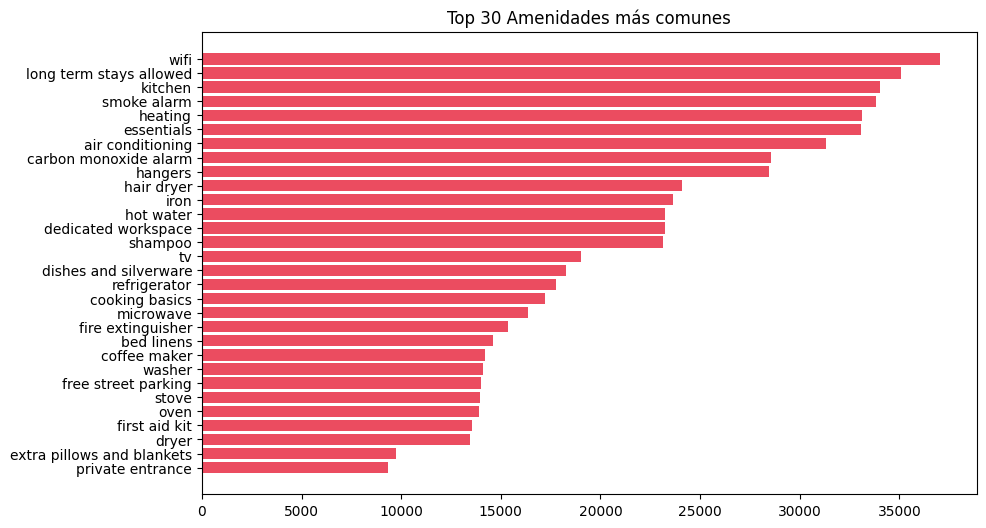

CPU times: total: 375 ms
Wall time: 379 ms


In [12]:
%%time
# Se obtiene gráfico de las 30 amenidades más comunes
top_items = freq.most_common(30)
amenities, counts = zip(*top_items)

plt.figure(figsize=(10,6))
plt.barh(amenities, counts, color='#EB4C60')
plt.gca().invert_yaxis()
plt.title("Top 30 Amenidades más comunes")
plt.show()

Podemos ver que algunas amenidades de las más comúnes se relaciona con las palabras más usadas en las nubes de comentarios.

En las nubes podemos ver que aparece kitchen, en la gráfica podemos ver que las amenidades más mencionadas son cocina, horno, refrigerador, basicos para cocinar, cafetera etc.

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> comments </li>
</ul>

In [15]:
# Unir todos los comentarios en un solo texto
text_comments = " ".join(df_data["comments"].dropna().astype(str))

In [26]:
%%time
# Generar la nube
wordcloud_comments = WordCloud(
    width=800, height=400,
    background_color="white",
    max_words=200,
    stopwords=set(STOPWORDS),
    colormap="viridis"
).generate(text_comments)

CPU times: total: 1min 52s
Wall time: 1min 52s


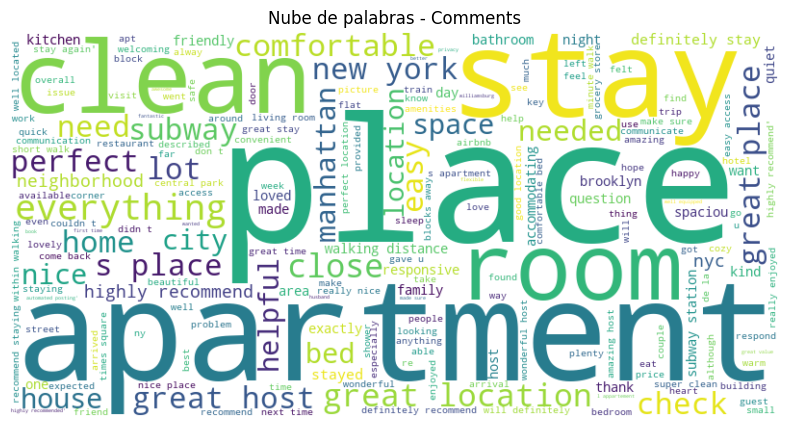

CPU times: total: 219 ms
Wall time: 226 ms


In [27]:
%%time
# Mostrar
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_comments, interpolation="bilinear")
plt.axis("off")
plt.title("Nube de palabras - Comments")
plt.show()

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> description </li>
</ul>

In [20]:
# Unir todas las descripciones en un solo texto
text_desc = " ".join(df_data["description"].dropna().astype(str))

In [24]:
%%time
# Generar la nube
wordcloud_desc = WordCloud(
    width=800, height=400,
    background_color="white",
    max_words=200,
    stopwords=set(STOPWORDS),
    colormap="plasma"
).generate(text_desc)

CPU times: total: 11.9 s
Wall time: 12 s


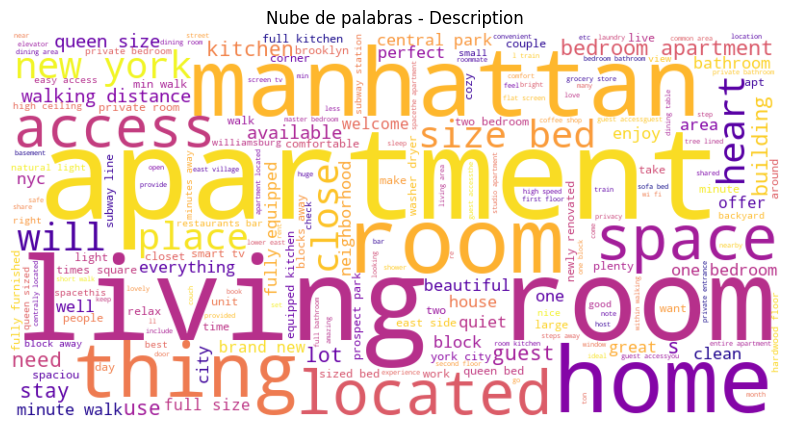

In [25]:
%%time
# Mostrar
plt.figure(figsize=(10,5))
plt.imshow(wordcloud_desc, interpolation="bilinear")
plt.axis("off")
plt.title("Nube de palabras - Description")
plt.show()

Esta nube nos muestra las palabras más usadas en las descripciones de cada airbnb, podemos ver que se hace referencia a la ubicación, a la tranquilidad, a las habitaciones y sus características

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 5: Imputación de nulos </h2> 

Se utiliza KNN para imputar los valores nulos en las variables numéricas, esto debido a la velocidad y poco uso de recursos de ejecución del método

In [35]:
df_num = df_data[var_num]

In [37]:
%%time
imputer = KNNImputer(n_neighbors=5)
df_imputed = imputer.fit_transform(df_num)

CPU times: total: 1min 55s
Wall time: 1min 44s


In [39]:
df_imputed = pd.DataFrame(df_imputed, columns=var_num, index=df_data.index)

# Reemplazar las columnas originales en dataframe con las imputadas
df_data[var_num] = df_imputed

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 6: Tratamiento de atípicos </h2> 

Se decide eliminar el 0.3% de valores atípicos de las variables numéricas debido al tamaño del dataset.
Se utiliza MCD debido a su capacidad de ignorar los valores extremos

In [43]:
#Usaremos minima covarianza
def outliers_mcd(df, contamination=0.03, random_state=1989, support_fraction=0.75):
    model = MCD(contamination=contamination, random_state=random_state, support_fraction=support_fraction)
    model.fit(df)
    preds = model.predict(df)
    return df[preds == 1]  #detectar

In [44]:
df_outliers = outliers_mcd(df_data[var_num])

In [45]:
df_outliers

,accommodates,bedrooms,beds,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,avg_price
291,9.0,2.0,3.0,30.0,1125.0,4.960,4.880,4.800,4.960,4.960,4.720,4.720,2500.000000
319,4.0,1.0,1.0,30.0,60.0,0.000,4.692,4.376,4.636,4.750,4.782,4.524,149.643836
420,4.0,1.0,2.0,30.0,30.0,0.000,3.524,3.320,3.640,4.094,4.050,2.874,157.000000
454,2.0,1.0,1.0,30.0,30.0,0.000,4.178,3.252,4.778,4.670,4.544,3.770,62.706849
629,3.0,1.0,2.4,5.0,60.0,5.000,0.000,0.000,0.000,0.000,0.000,0.000,250.000000
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37850,2.0,1.0,1.0,3.0,60.0,1.000,1.000,1.000,1.000,1.000,1.000,1.000,135.972603
38021,2.0,1.0,1.0,1.0,365.0,5.000,5.000,5.000,5.000,5.000,3.000,1.000,94.706849
38027,12.0,6.0,10.0,1.0,1125.0,4.702,4.686,4.512,4.376,4.522,4.442,4.068,2600.000000
38149,5.0,1.0,3.0,1.0,12.0,4.400,4.156,4.486,4.558,4.392,4.598,4.176,5655.000000


In [46]:
df_clean = df_data.drop(df_outliers.index)

In [48]:
df_clean.to_csv('../data/data_clean.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 7: Escalado de datos </h2> 

Se decide utilizar RobustScaler debido a que en el EDA pudimos viaulizar en los histogramas que había varias varaibles con colas pesadas

In [24]:
df_data=pd.read_csv('../data/data_clean.csv')

In [25]:
var_num = ["accommodates", "bedrooms", "beds", "minimum_nights", "maximum_nights", "review_scores_rating", 
           "review_scores_accuracy", "review_scores_cleanliness", "review_scores_checkin", "review_scores_communication", 
           "review_scores_location", "review_scores_value", "avg_price"] # 13 varaibles numéricas

In [27]:
var_other = df_data[["listing_id", "description", "neighbourhood_group_cleansed", "property_type", "room_type", 
             "bathrooms_text", "amenities", "comments"]] # 8 variables categóricas de texto y id

In [11]:
#Usamos robust-scaling
robustscaler = RobustScaler()
robustscaler.fit(df_data[var_num])

,with_centering,True
,with_scaling,True
,quantile_range,"(25.0, ...)"
,copy,True
,unit_variance,False


In [12]:
%%time
df_std = pd.DataFrame(robustscaler.transform(df_data[var_num]), columns = df_data[var_num].columns, index = df_data[var_num].index)

CPU times: total: 0 ns
Wall time: 0 ns


In [13]:
df_std

,accommodates,bedrooms,beds,minimum_nights,maximum_nights,review_scores_rating,review_scores_accuracy,review_scores_cleanliness,review_scores_checkin,review_scores_communication,review_scores_location,review_scores_value,avg_price
0,-0.5,0.0,0.0,0.000000,0.000000,-0.214286,-0.46875,-0.285088,-0.817308,-0.672727,0.030303,-0.890052,0.692759
1,0.5,0.0,2.0,-1.074074,-0.370892,-0.809524,-0.90625,-0.570175,-0.721154,-0.627273,-0.424242,-0.287958,-0.335006
2,0.0,0.0,0.0,0.000000,-0.370892,-0.642857,-2.03125,-1.447368,-0.096154,-0.127273,-1.151515,-0.602094,-0.470611
3,1.0,1.0,1.0,-0.925926,0.000000,0.500000,0.40625,0.548246,0.336538,0.281818,-1.060606,0.654450,1.336111
4,0.0,0.0,0.0,-1.037037,-1.043192,-1.380952,-2.06250,-2.236842,-1.298077,-2.354545,0.060606,-1.020942,-0.403384
...,...,...,...,...,...,...,...,...,...,...,...,...,...
37123,0.0,0.0,0.0,-1.074074,0.000000,0.090476,0.05625,0.061404,-0.432692,-0.200000,-0.848485,-0.827225,-0.253505
37124,0.0,0.0,0.8,-1.074074,0.000000,-0.476190,-0.56250,-0.557018,-0.846154,-0.927273,-0.103030,-0.314136,-0.370346
37125,0.0,0.0,0.0,-1.074074,0.000000,-0.290476,-0.45000,-0.447368,-0.961538,-0.554545,-0.430303,-0.350785,0.266697
37126,0.0,0.0,0.0,-1.074074,0.000000,-0.447619,-0.81875,-0.649123,-1.375000,-1.481818,-0.842424,-0.753927,-0.009854


In [30]:
df_std_complete = pd.concat([df_std, var_other], axis = 1)

In [32]:
df_std_complete.to_csv('../data/data_scaled.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 8: Normalización y codificación de variables </h2> 

In [33]:
df_clean=pd.read_csv("../data/data_scaled.csv")

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> neighbourhood_group_cleansed </h2>

<p> Se evaluan los valores únicos de los vecindarios, y se decide usar label encoding para su codificación </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>0:</strong> Manhattan </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>1:</strong> Brooklyn </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>2:</strong> Queens </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>3:</strong> Staten Island </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>4:</strong> Bronx </li>
</ul>

In [34]:
df_clean['neighbourhood_group_cleansed'].unique()

array(['Manhattan', 'Brooklyn', 'Queens', 'Staten Island', 'Bronx'],
      dtype=object)

In [35]:
# neighbourhood: LabelEncoder
le_ngb = LabelEncoder()
df_clean["neighbourhood_encode"] = le_ngb.fit_transform(df_clean["neighbourhood_group_cleansed"])

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> property_type </h2>

<p> Se crea un mapping de las variables para agruparlas en las categorías hogar, loft, hotel, casa, compartido y otros. </p>
<p> Posteriormente a estas 6 categorías se les aplica label encoding para su codificación. </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>0:</strong> Hogar </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>1:</strong> Loft </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>2:</strong> Hotel </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>3:</strong> Casa </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>4:</strong> Compartido </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>5:</strong> Otros </li>
</ul>

In [36]:
# Diccionario de mapeo
subcat_map = {
    # Hogar
    "Entire rental unit": "hogar",
    "Entire guest suite": "hogar",
    "Entire residential home": "hogar",
    "Entire townhouse": "hogar",
    "Entire condominium (condo)": "hogar",
    "Entire vacation home": "hogar",
    "Entire serviced apartment": "hogar",
    "Entire cottage": "hogar",
    "Entire bungalow": "hogar",
    "Entire villa": "hogar",
    "Entire cabin": "hogar",
    "Entire bed and breakfast": "hogar",
    "Entire guesthouse": "hogar",
    "Entire loft": "hogar",
    "Entire place": "hogar",
    "Entire home/apt": "hogar",

    # Loft
    "Private room in loft": "loft",
    "Shared room in loft": "loft",

    # Hotel
    "Room in boutique hotel": "hotel",
    "Room in aparthotel": "hotel",
    "Room in serviced apartment": "hotel",
    "Room in hotel": "hotel",
    "Room in resort": "hotel",

    # Casa
    "Private room in residential home": "casa",
    "Private room in townhouse": "casa",
    "Private room in condominium (condo)": "casa",
    "Private room in guest suite": "casa",
    "Private room in guesthouse": "casa",
    "Private room in vacation home": "casa",
    "Private room in serviced apartment": "casa",
    "Private room in bungalow": "casa",
    "Private room in villa": "casa",
    "Private room in tiny house": "casa",
    "Private room in in-law": "casa",
    "Private room in barn": "casa",
    "Private room in farm stay": "casa",
    "Private room in earth house": "casa",
    "Private room in cycladic house": "casa",
    "Private room": "casa",

    # Compartido
    "Shared room in rental unit": "compartido",
    "Shared room in residential home": "compartido",
    "Shared room in condominium (condo)": "compartido",
    "Shared room in townhouse": "compartido",
    "Shared room in guest suite": "compartido",
    "Shared room in floor": "compartido",
    "Shared room in hostel": "compartido",
    "Shared room in guesthouse": "compartido",
    "Shared room in bed and breakfast": "compartido",
    "Shared room in island": "compartido",
    "Shared room in bungalow": "compartido",
    "Shared room in serviced apartment": "compartido",
    "Shared room in casa particular": "compartido",

    # Otros
    "Boat": "otros",
    "Houseboat": "otros",
    "Camper/RV": "otros",
    "Tent": "otros",
    "Cave": "otros",
    "Tiny house": "otros",
    "Castle": "otros",
    "Barn": "otros",
    "Lighthouse": "otros",
    "Train": "otros",
    "Casa particular": "otros",
    "Floor": "otros"
}

In [37]:
df_clean["property_norm"] = df_clean["property_type"].map(subcat_map)

In [38]:
# property_type: LabelEncoder
le_property = LabelEncoder()
df_clean["property_encode"] = le_property.fit_transform(df_clean["property_norm"])

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> room_type </h2>

<p> El tipo de habitación solamente puede tomar 4 valroes, por lo que se aplica label encoding directamente </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>0:</strong> Entire home/apt </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>1:</strong> Private room </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>2:</strong> Hotel room </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>3:</strong> Shared room </li>
</ul>

In [39]:
df_clean['room_type'].unique()

array(['Entire home/apt', 'Private room', 'Hotel room', 'Shared room'],
      dtype=object)

In [40]:
# property_type: LabelEncoder
le_room_t = LabelEncoder()
df_clean["room_type_encode"] = le_room_t.fit_transform(df_clean["room_type"])

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> bathrooms_text </h2>

<p> La cantidad de baños en el texto puede tomar varios valores, por lo que se decide clasificarlos: </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>0 ó 1:</strong> nulos_o_1 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>2 ó 3:</strong> 2_a_3 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>4 ó 5:</strong> 4_a_6 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>6 a 8:</strong> 6_a_8 </li>
</ul>

<p> Posteriormente se realiza codificación con label encoding: </p>
<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>nulos_o_1:</strong> 0 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>2_a_3:</strong> 1 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>4_a_6:</strong> 2 </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>6_a_8:</strong> 3 </li>
</ul>

In [41]:
df_clean['bathrooms_text'].unique()

array(['1 bath', nan, '1.5 baths', '1 shared bath', '1 private bath',
       'Shared half-bath', '2 baths', '1.5 shared baths', '3 baths',
       'Half-bath', '2.5 baths', '2 shared baths', '0 baths', '4 baths',
       '0 shared baths', 'Private half-bath', '5 baths', '4.5 baths',
       '5.5 baths', '2.5 shared baths', '3.5 baths', '3 shared baths',
       '4 shared baths', '6 baths', '3.5 shared baths',
       '4.5 shared baths', '8 baths', '7 baths', '6 shared baths',
       '7.5 baths'], dtype=object)

In [42]:
def norm_bathrooms(value):
    if pd.isna(value):
        return np.nan
    value = str(value).lower()
    
    if "half" in value:
        return 0.5
    try:
        num = float(value.split()[0])
        return num
    except:
        return np.nan

df_clean["bathrooms_rec"] = df_clean["bathrooms_text"].apply(norm_bathrooms)

In [43]:
def categorize_bathrooms(x):
    if pd.isna(x) or x <= 1:
        return "nulos_o_1"
    elif 2 <= x <= 3:
        return "2_a_3"
    elif 4 <= x <= 5:
        return "4_a_5"
    elif 6 <= x <= 8:
        return "6_a_8"
    else:
        return "otros"  # por si aparece algo fuera de rango

df_clean["bathrooms_cat"] = df_clean["bathrooms_rec"].apply(categorize_bathrooms)

In [44]:
# bathrooms_text: LabelEncoder
le_baths = LabelEncoder()
df_clean["baths_encode"] = le_baths.fit_transform(df_clean["bathrooms_cat"])

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Limpieza de variables </h2>

<p> Se realiza limpieza de variables que ya fueron codificadas, se eliminan del dataframe </p>

In [45]:
#Eliminamos las variables ya codificadas
df_clean = df_clean.drop(["neighbourhood_group_cleansed", "property_type", "property_norm", "room_type",
             "bathrooms_text", "bathrooms_cat", "bathrooms_rec"], axis = 1)

In [46]:
df_clean.to_csv('../data/data_norm.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 9: Transformación variables de texto </h2> 

In [47]:
# Lectura de archivo
df_norm=pd.read_csv("../data/data_norm.csv")

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Variables: description y comments </h2>

<p> Se decide utilizar TfidfVectorizer para el tratamiento de estas varaibles de texto con el objetivo de que destaque las palabras clave y se les reduzca el peso a las stopwords, hay reseñas en varios idiomas, pero en su mayoría las reseñas eran en ingles, de igual forma se limitan las palabras más comúnes a solamente 500 </p>

In [48]:
vectorizer = TfidfVectorizer(max_features=500, stop_words="english")
desc_tfidf = vectorizer.fit_transform(df_norm["description"].fillna(""))
comments_tfidf = vectorizer.fit_transform(df_norm["comments"].fillna(""))

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> amenities </h2>

<p> Se decide utilizar TfidfVectorizer para el tratamiento de estas varaibles de texto con el objetivo de que destaque las palabras clave y se les reduzca el peso a las stopwords, hay reseñas en varios idiomas, pero en su mayoría las reseñas eran en ingles, de igual forma se limitan las palabras más comúnes a solamente 500 </p>

In [49]:
# Uso de binarizer para transformar listas en columnas binarias
%%time
mlb = MultiLabelBinarizer()
amenities_encoded = mlb.fit_transform(df_norm["amenities"])
amenities_df = pd.DataFrame(amenities_encoded, columns=mlb.classes_, index=df_norm.index)

In [50]:
#   Transformación de texto en frecuencias de palabras ponderadas
%%time
desc_df = pd.DataFrame(desc_tfidf.toarray(), index=df_norm.index)
comments_df = pd.DataFrame(comments_tfidf.toarray(), index=df_norm.index)

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Obtención de dataframe conjunto </h2>

In [51]:
# Concatenado de variables escaladas, numéricas, de texto y las listas transformadas
df_final = pd.concat([df_norm, desc_df, comments_df, amenities_df], axis=1)

In [52]:
print("Dimensiones finales:", df_final.shape)
print("Columnas:", df_final.columns[:20])

Dimensiones finales: (37128, 1085)
Columnas: Index(['accommodates', 'bedrooms', 'beds', 'minimum_nights', 'maximum_nights',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'avg_price', 'listing_id', 'description',
       'amenities', 'comments', 'neighbourhood_encode', 'property_encode',
       'room_type_encode'],
      dtype='object')


In [54]:
## Se eliminan variables de texto que ya fueron transformadas y la de id, que no aportará más información ni nos sevirá más para hacer uniones
df_final = df_final.drop(["listing_id", "description", "amenities", "comments"], axis=1)

In [55]:
df_final.to_csv('../data/data_tfidf.csv', index=False)

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 10: Reducción de dimensiones y clusterización </h2> 

In [90]:
df_transformed=pd.read_csv("../data/data_tfidf.csv")

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> UMAP - 3 Componentes </h2>

<p> Se decide hacer uso de UMAP para la reducción de dimensiones debido a du buen comportamiento y estabilidad tanto en clustering como en la visualización, tambipen debido al tamaño del dataset, para que la ejecución fuera rápida. </p>

<p> Se realiza una ejecución muestra a 3 componentes para ejemplificar el comportamiento </p>

<p> En la visualziación podemos ver un comportamiento estable, con algunos valores atípicos </p>

In [91]:
%%time
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, random_state=42)
embedding_3d = umap_model.fit_transform(df_transformed)

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



CPU times: total: 1min
Wall time: 47.6 s


In [92]:
data_umap = pd.DataFrame(embedding_3d, columns=["UMAP1", "UMAP2", "UMAP3"], index=df_transformed.index)

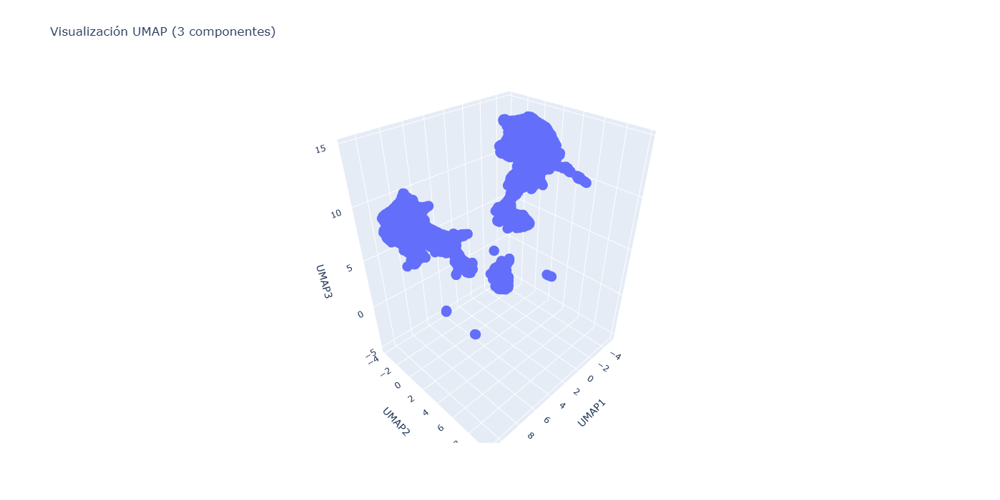

CPU times: total: 93.8 ms
Wall time: 96.5 ms


In [93]:
%%time
fig = px.scatter_3d(
    data_umap, x="UMAP1", y="UMAP2", z="UMAP3",
    title="Visualización UMAP (3 componentes)",
    width=900, height=700
)
fig.show()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> KMeans | GMM | DBSCAN - 15, 20 y 30 Componentes </h2>

<p> Se decide probar UMAP con 15, 20 y 30 componentes para evaluar por medio de las métricas el desempeño para los siguientes algoritmos de clusering. </p>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> KMeans </li>
    <li style="color:#EB4C60; font-size: 1em;"> DBSCAN </li>
    <li style="color:#EB4C60; font-size: 1em;"> GMM </li>
</ul>

<p> Se obtienen las siguientes métricas de desempeño: </p>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> Silhouette </li>
    <li style="color:#EB4C60; font-size: 1em;"> Davies-Bouldin </li>
    <li style="color:#EB4C60; font-size: 1em;"> Calinski-Harabasz </li>
</ul>

<p> En las métricas podemos visualizar que a quién le fue mejor fue a KMeans a 30 componentes por lo que se determina que es el método ganador </p>
<img src="../imgs/metricas_clustering.png" alt="En verde podemos ver que a Kmenas le fue bien en todas las métricas" width="900" style="display: block; margin: 0 auto;">

In [94]:
%%time
# Diccionario para guardar resultados
results = []

for n in [15, 20, 30]:
    # Reducción con UMAP
    umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=n, random_state=42)
    embedding = umap_model.fit_transform(df_transformed)
    
    # --- KMeans ---
    kmeans = KMeans(n_clusters=5, random_state=42)
    labels_kmeans = kmeans.fit_predict(embedding)
    results.append({
        "n_components": n,
        "method": "KMeans",
        "Silhouette": silhouette_score(embedding, labels_kmeans),
        "Davies-Bouldin": davies_bouldin_score(embedding, labels_kmeans),
        "Calinski-Harabasz": calinski_harabasz_score(embedding, labels_kmeans)
    })
    
    # --- DBSCAN ---
    dbscan = DBSCAN(eps=0.5, min_samples=10)
    labels_dbscan = dbscan.fit_predict(embedding)
    if len(set(labels_dbscan)) > 1:  # evitar error si todo queda en un cluster
        results.append({
            "n_components": n,
            "method": "DBSCAN",
            "Silhouette": silhouette_score(embedding, labels_dbscan),
            "Davies-Bouldin": davies_bouldin_score(embedding, labels_dbscan),
            "Calinski-Harabasz": calinski_harabasz_score(embedding, labels_dbscan)
        })
    
    # --- GMM ---
    gmm = GaussianMixture(n_components=5, random_state=42)
    labels_gmm = gmm.fit_predict(embedding)
    results.append({
        "n_components": n,
        "method": "GMM",
        "Silhouette": silhouette_score(embedding, labels_gmm),
        "Davies-Bouldin": davies_bouldin_score(embedding, labels_gmm),
        "Calinski-Harabasz": calinski_harabasz_score(embedding, labels_gmm)
    })

# Convertir resultados a DataFrame
results_df = pd.DataFrame(results)
print(results_df)

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



   n_components  method  Silhouette  Davies-Bouldin  Calinski-Harabasz
0            15  KMeans    0.476411        0.980142       62705.930077
1            15  DBSCAN    0.168095        1.020203       17900.813719
2            15     GMM    0.462631        1.069668       60784.532199
3            20  KMeans    0.474291        0.988507       63255.572833
4            20  DBSCAN    0.146671        1.156010       16765.215204
5            20     GMM    0.462111        1.081067       61404.712029
6            30  KMeans    0.595167        0.771189       66963.816612
7            30  DBSCAN    0.261885        1.178162       17446.568882
8            30     GMM    0.594522        0.794056       65487.317550
CPU times: total: 21min 7s
Wall time: 9min 40s


<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Silueta KMeans - 10 Clusters </h2>

<p> Se muestra silueta del algoritmo ganador a 10 clusters solamente por el tiempo de ejecución que le toma </p>
<p> Se evalúa el score de silueta obtenido y se puede observar que el mejor score es para 4 clusters con una puntuación de 0.65 </p>

N Clusters : 2
Score Silueta : 0.53


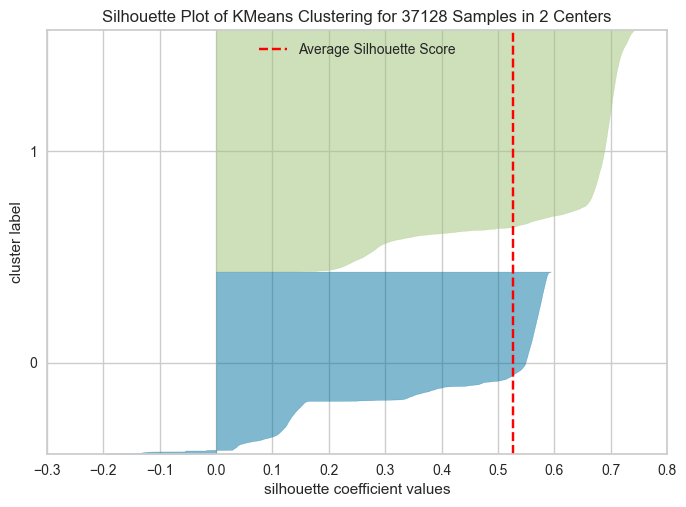

N Clusters : 3
Score Silueta : 0.64


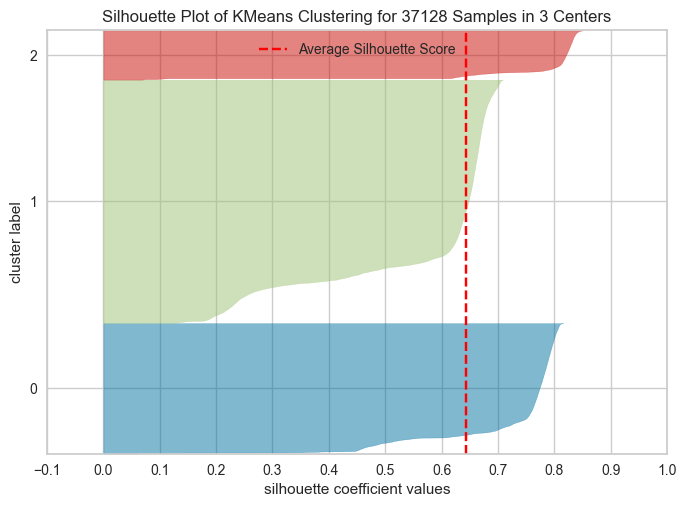

N Clusters : 4
Score Silueta : 0.65


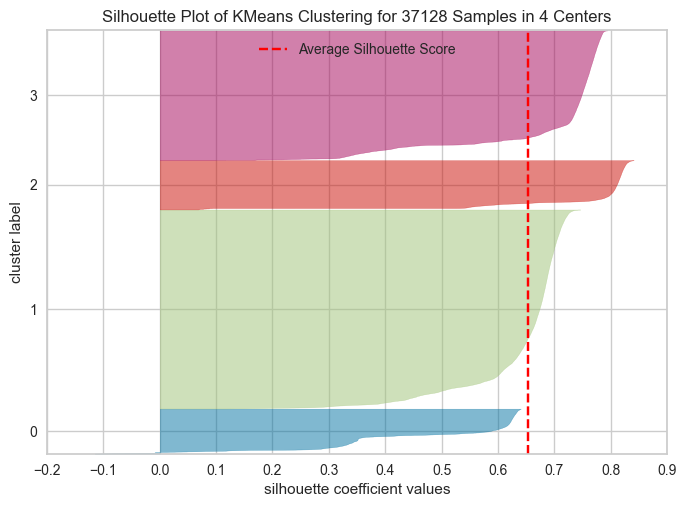

N Clusters : 5
Score Silueta : 0.6


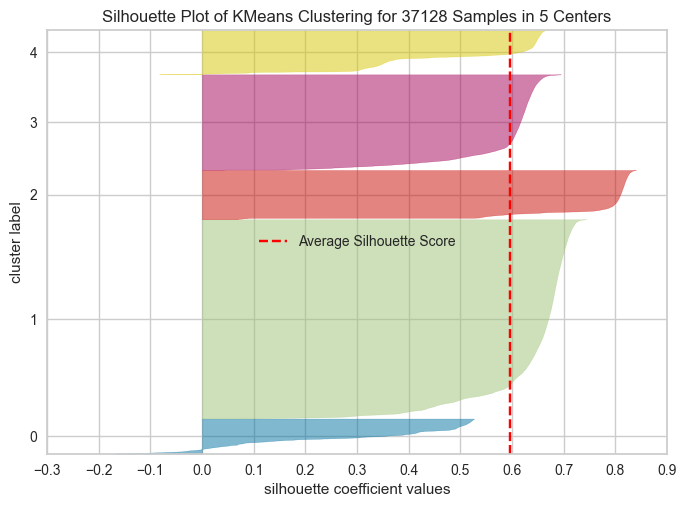

N Clusters : 6
Score Silueta : 0.42


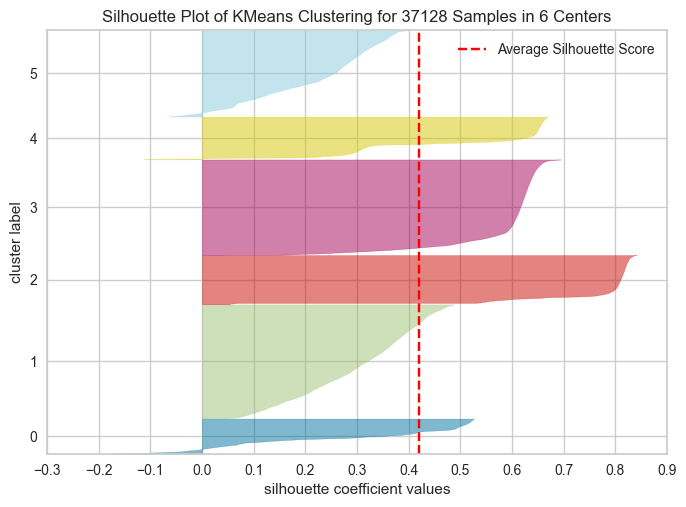

N Clusters : 7
Score Silueta : 0.44


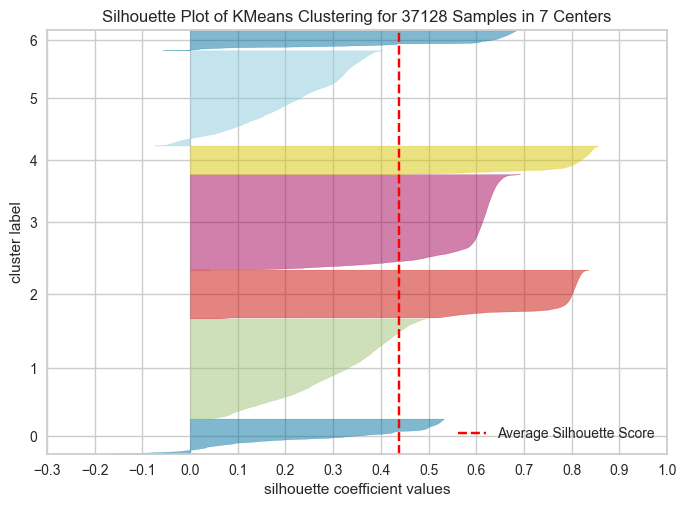

N Clusters : 8
Score Silueta : 0.44


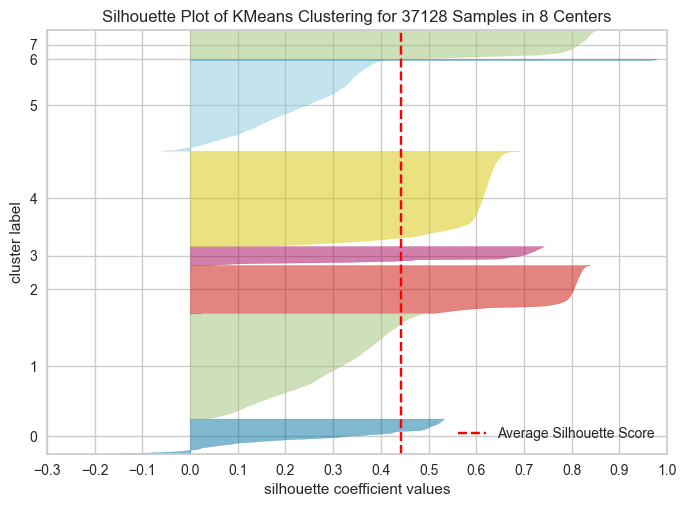

N Clusters : 9
Score Silueta : 0.42


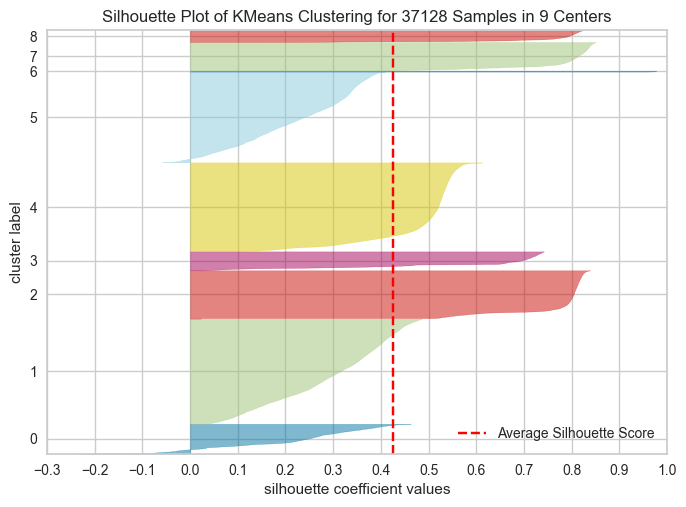

CPU times: total: 28min 35s
Wall time: 11min 10s


In [97]:
%%time
for k in range(2, 10):
    km = KMeans(n_clusters=k, random_state=200)
    visualizer = SilhouetteVisualizer(km, colors='yellowbrick')
    visualizer.fit(embedding)  # aquí usas los embeddings de UMAP
    print(f"N Clusters : {k}")
    print(f"Score Silueta : {round(visualizer.silhouette_score_, 2)}")
    visualizer.show()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Codo KMeans - 30 Componentes </h2>

<p> Se muestra el codo del algoritmo ganador reduciendo a 30 componentes, debido a que fue el algoritmo ganador </p>
<p> Podemos confirmar que de igual forma que en la silueta, los clusters recomendados son 4 </p>

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



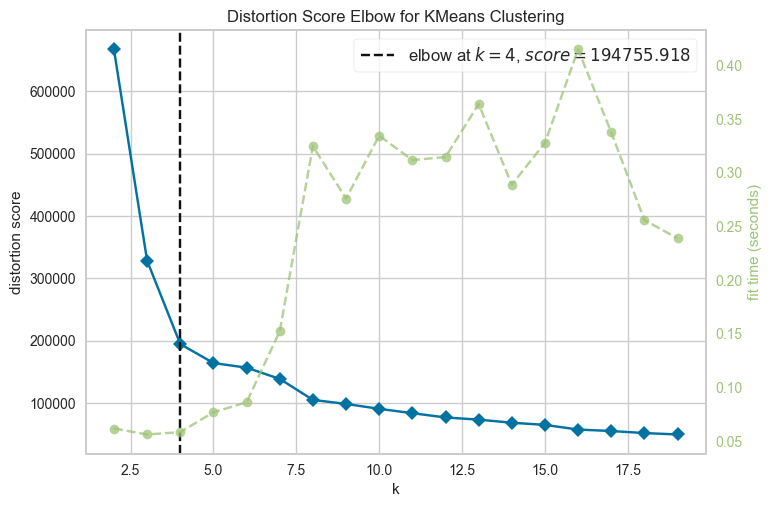

CPU times: total: 2min 25s
Wall time: 1min 50s


<Axes: title={'center': 'Distortion Score Elbow for KMeans Clustering'}, xlabel='k', ylabel='distortion score'>

In [101]:
%%time
# Reducción con UMAP a 30 componentes
umap_model = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=30, random_state=42)
embedding_cluster = umap_model.fit_transform(df_transformed)

# Función para graficar el codo
def codo(X, min_compo, max_compo):
    model = KMeans(random_state=42)
    visualizer = KElbowVisualizer(model, k=(min_compo, max_compo))
    visualizer.fit(X)
    return visualizer.show()

# Ejecución del codo
codo(embedding_cluster, 2, 20)

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> KMeans - Distribución de clusters </h2>

<p> Se determina que el algoritmo a usar es KMeans con 4 clusters </p>
<p> Se obtiene el diagrama de pastel para saber como quedó la distribución de los datos en cada cluster </p>
<p> Podemos observar que no hay desbalance en los clusters, el clusters que abarca mayor porcentaje es el de color morado </p>

In [105]:
%%time
# KMeans con 4 clusters
KM_4 = KMeans(n_clusters=4, n_init=100, init='k-means++', random_state=42).fit(embedding_cluster)

df_transformed['cluster_4'] = KM_4.labels_

# Contar elementos por cluster
pie = df_transformed.groupby('cluster_4').size().reset_index()
pie.columns = ['cluster_4', 'value']

CPU times: total: 18.9 s
Wall time: 4.44 s


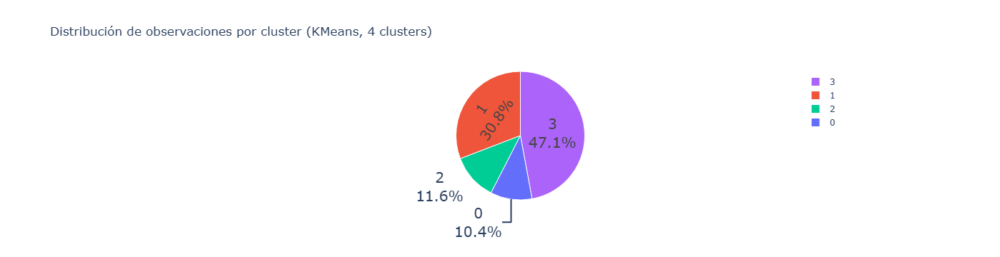

In [106]:
# Gráfico de pastel
fig = px.pie(
    pie,
    values='value',
    names='cluster_4',
    color='cluster_4',
    title="Distribución de observaciones por cluster (KMeans, 4 clusters)"
)

fig.update_traces(
    hoverinfo='label+percent',
    textinfo='percent+label',
    textfont_size=20,
    marker=dict(line=dict(color='white', width=1))
)

fig.update_layout(uniformtext_minsize=15, uniformtext_mode='hide')
fig.show()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> KMeans - Visualización de clusters a 3 componentes </h2>

<p> Para terminos de visualización de los 4 clusters, se usan 3 componentes </p>

<p> Podemos ver una buena clusterización para los colores verde y azul. </p>
<p> Los valores rojo y verde son los que más clusterizan valores atípicos o ruido, pero sabemos que KMeans no es capaz de asignarlos a ruido. </p>
<p> El cluster de color morado pareciera que esta segmentado en dos partes, como si hubiera la posibilidad de crear un quinto cluster. </p>
<p> El cluster morado y rojo son lo más cercanos, hay algunos puntos, son pocos, que parecieran mal clusterizados. </p>

In [108]:
%%time
# Reducción de dimensiones a 3 componentes
umap_vis3d = umap.UMAP(n_neighbors=15, min_dist=0.1, n_components=3, random_state=42)
embedding_3d = umap_vis3d.fit_transform(df_transformed)

# KMeans con 4 clusters
KM_4 = KMeans(n_clusters=4, n_init=100, init='k-means++', random_state=42).fit(embedding_3d)
labels = KM_4.labels_

# Crear DataFrame con etiquetas
datos_vis = pd.DataFrame({
    "comp1": embedding_3d[:,0],
    "comp2": embedding_3d[:,1],
    "comp3": embedding_3d[:,2],
    "cluster": labels
})

C:\envs\spacy_env\Lib\site-packages\umap\umap_.py:1952: UserWarning:

n_jobs value 1 overridden to 1 by setting random_state. Use no seed for parallelism.



CPU times: total: 1min 44s
Wall time: 58.2 s


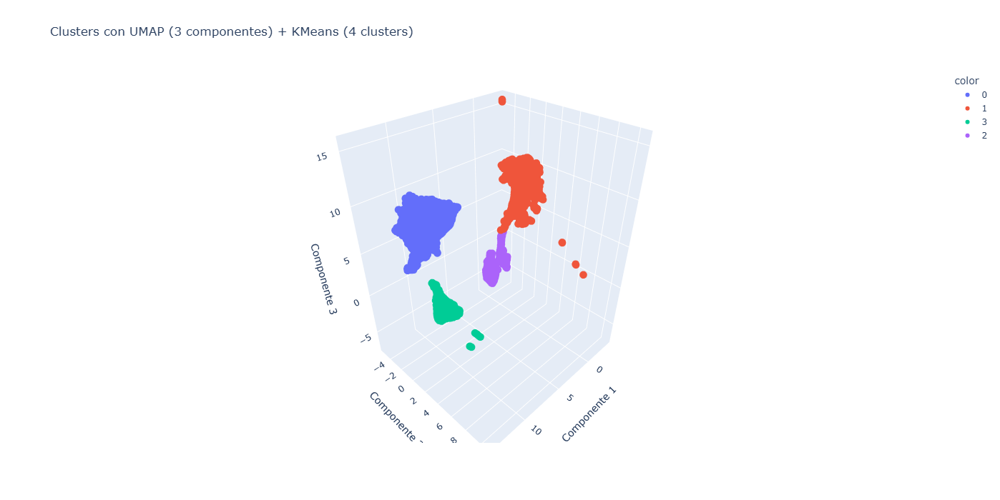

In [145]:
# Gráfico 3D
fig = px.scatter_3d(
    datos_vis, x="comp1", y="comp2", z="comp3",
    color=datos_vis["cluster"].astype(str),
    labels={"comp1": "Componente 1", "comp2": "Componente 2", "comp3": "Componente 3"},
    title="Clusters con UMAP (3 componentes) + KMeans (4 clusters)"
)

# Personalización de puntos
fig.update_traces(
    marker=dict(size=6, line=dict(width=0, color="Black")),
    selector=dict(mode="markers")
)

# Tamaño gráfico
fig.update_layout(
    width=900,   # ancho
    height=700   # alto
)


fig.show()

<h2 style="background-color:#F2A4B2; color:#595959;">Paso 11: Perfilamiento </h2>

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Categóricas </h2>

<p> Se obtienen gráficos de barras para las siguientes variables categóricas: </p>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>neighbourhood_encode: </strong> Poblado donde se encuentra situado el airbnb; <strong>0:</strong>Manhattan <strong>1:</strong>Brooklyn <strong>2:</strong>Queens <strong>3:</strong>Staten Island <strong>4:</strong>Bronx </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>property_encode: </strong> Tipo de propiedad; <strong>0:</strong>Hogar <strong>1:</strong>Loft <strong>2:</strong>Hotel <strong>3:</strong>Casa <strong>4:</strong>Compartido <strong>5:</strong> Otros </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>room_type_encode: </strong> Tipo de habitación; <strong>0:</strong>Entire home/apt <strong>1:</strong>Private room <strong>2:</strong>Hotel room <strong>3:</strong>hared room </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>baths_encode:</strong> Cantidad de baños con los que cuenta; <strong>0:</strong>0 a 1 <strong>1:</strong>2 a 3 <strong>2:</strong>4 a 5 <strong>3:</strong>6 a 8 </li>
</ul>

In [111]:
def plot_categorical_by_cluster(
    df: pd.DataFrame,
    cat_col: str,
    cluster_col: str,
    top_k: int = 10,
    normalize: str = "cluster"
):
    d = df[[cluster_col, cat_col]].copy()
    top_cats = d[cat_col].astype("object").value_counts(dropna=False).head(top_k).index
    d = d[d[cat_col].astype("object").isin(top_cats)]
    ct = pd.crosstab(d[cluster_col], d[cat_col])

    if normalize == "cluster":
        pct = (ct.div(ct.sum(axis=1), axis=0) * 100)
        ylabel = "% dentro del clúster"
    else:
        pct = (ct / ct.values.sum() * 100)
        ylabel = "% global"

    plt.figure(figsize=(10, 5))
    pct.T.plot(kind="bar")
    plt.title(f"Distribución de {cat_col} por clúster ({cluster_col})")
    plt.xlabel(cat_col)
    plt.ylabel(ylabel)
    plt.tight_layout()
    plt.show()

CPU times: total: 0 ns
Wall time: 0 ns


In [114]:
v_feats = ["neighbourhood_encode", "property_encode", "room_type_encode", "baths_encode"]

<Figure size 1000x500 with 0 Axes>

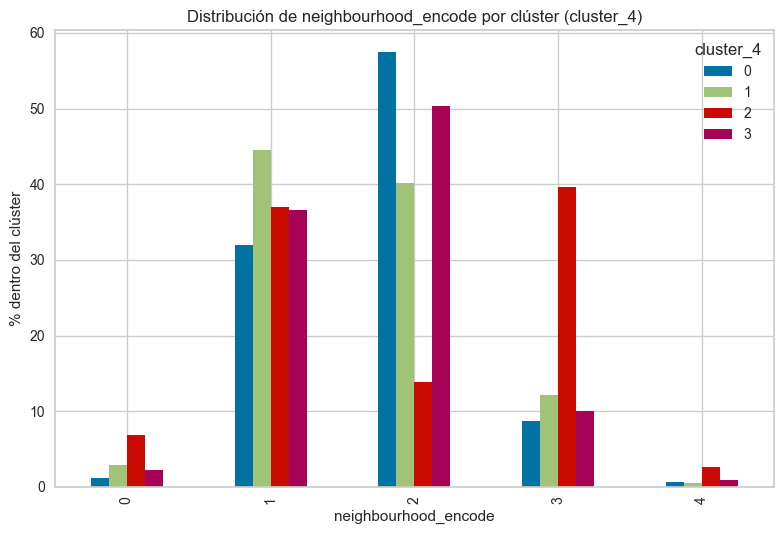

<Figure size 1000x500 with 0 Axes>

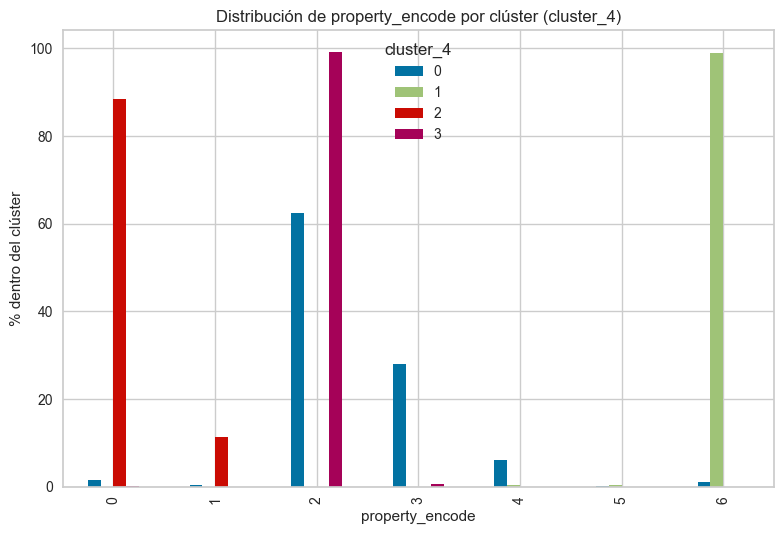

<Figure size 1000x500 with 0 Axes>

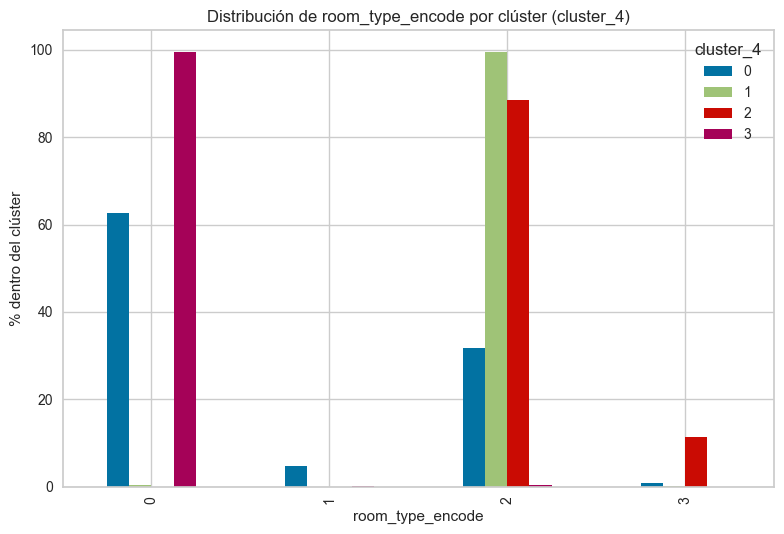

<Figure size 1000x500 with 0 Axes>

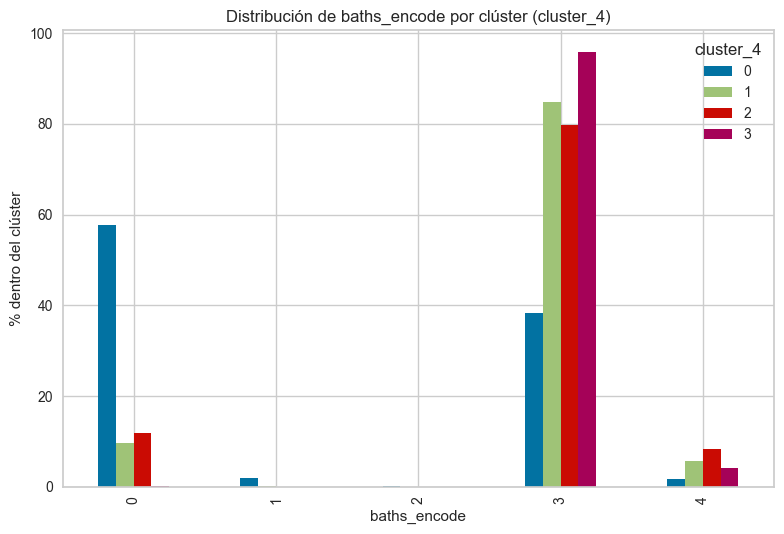

CPU times: total: 828 ms
Wall time: 937 ms


In [115]:
%%time
# Ejemplo: perfilamiento de varias variables categóricas
for col in v_feats:  # lista de variables categóricas que quieras analizar
    plot_categorical_by_cluster(df=df_transformed, cat_col=col, cluster_col="cluster_4")

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Numéricas </h2>

<p> Se obtienen gráficos de barras para las siguientes variables numéricas: </p>

<ul>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>accommodates: </strong> Total de huespedes que pueden alojarse </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>bedrooms: </strong> Total de habitaciones con las que se cuenta en el airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>beds: </strong> Total de camas en el airbnb </li>
    <li style="color:#EB4C60; font-size: 1em;"> <strong>avg_price: </strong> Costo promedio del airbnb </li>
</ul>

In [117]:
data_numerics = pd.read_csv('../data/data_clean.csv')

In [119]:
data_numerics.columns

Index(['listing_id', 'description', 'neighbourhood_group_cleansed',
       'property_type', 'room_type', 'accommodates', 'bathrooms_text',
       'bedrooms', 'beds', 'amenities', 'minimum_nights', 'maximum_nights',
       'review_scores_rating', 'review_scores_accuracy',
       'review_scores_cleanliness', 'review_scores_checkin',
       'review_scores_communication', 'review_scores_location',
       'review_scores_value', 'comments', 'avg_price'],
      dtype='object')

In [121]:
KM_4 = KMeans(n_clusters=4, random_state=42).fit(embedding_cluster)
data_numerics['cluster_4'] = KM_4.labels_

In [133]:
perfil_accom = data_numerics.groupby("cluster_4")[["accommodates", "bedrooms", "beds"]].mean()

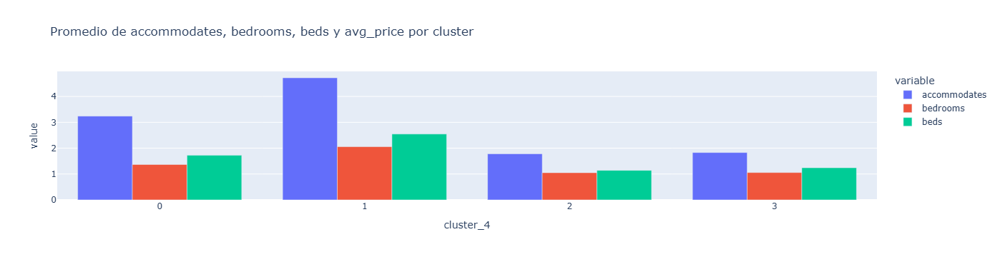

In [137]:
# Resetear índice para que cluster_4 sea columna
perfil_accom_reset = perfil_num.reset_index()

# Gráfico de barras agrupadas
fig = px.bar(
    perfil_accom_reset,
    x="cluster_4",
    y=["accommodates", "bedrooms", "beds"],
    barmode="group",
    title="Promedio de accommodates, bedrooms, beds y avg_price por cluster"
)
fig.show()

In [139]:
perfil_accom = data_numerics.groupby("cluster_4")[["avg_price"]].mean()

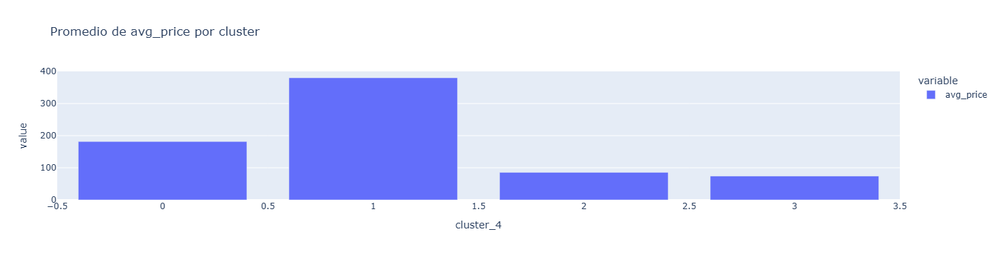

In [140]:
# Resetear índice para que cluster_4 sea columna
perfil_accom_reset = perfil_num.reset_index()

# Gráfico de barras agrupadas
fig = px.bar(
    perfil_accom_reset,
    x="cluster_4",
    y=["avg_price"],
    barmode="group",
    title="Promedio de avg_price por cluster"
)
fig.show()

<h2 style="color:#EB4C60; font-size: 1.2em; font-weight: bold;"> Perfilamiento </h2>

<ul>
    <li style="color:#31709E; font-size: 1em;"> <strong>Cluster 0: </strong> Total de huespedes que pueden alojarse </li>
    <li style="color:#A6C27F; font-size: 1em;"> <strong>Cluster 1: </strong> Total de habitaciones con las que se cuenta en el airbnb </li>
    <li style="color:#B92A1A; font-size: 1em;"> <strong>Cluster 2: </strong> Total de camas en el airbnb </li>
    <li style="color:#971E57; font-size: 1em;"> <strong>Cluster 3: </strong> Costo promedio del airbnb </li>
</ul>

**cluster 0 - Estancias largas y familiares:** están en queens, en su mayoria son hoteles o casas, casas u apartamentos completos, 1 a 3 baños, aceptan como máximo 4 personas, suelen ser los más caros

**cluster 1 - Vacacionales** están en brooklyn Suelen ser habitaciones de hotel, 1 baño, suelen aceptar más personas 4 o más comparado con el resto de clusters, tiene mator cantidad de camas

**cluster 2 - Estancias pequeñas**  están en Staten Island y brooklyn, suelen ser casas, suelen ser habitaciones de hotel o habitaciones compartidas, 1 baño, máximo dos personas

**cluster 3 - Estancias pequeñas y económicas** están en queens, suelen ser hoteles, habitaciones completas, 1 a 2 baños, suelen ser los más económicos